In [2]:
import pandas as pd
import numpy as np
import pmdarima as pm
import matplotlib.pyplot as plt
from pyspark.sql import SparkSession


In [ ]:
spark = SparkSession.builder.appName("ExcelToSpark").getOrCreate()
file1_pd = pd.read_csv("fl1.csv")
file2_pd = pd.read_csv("fl2.csv")

file1_spark = spark.createDataFrame(file1_pd)
file2_spark = spark.createDataFrame(file2_pd)

df_joined = file1_spark.join(file2_spark, on='KEY', how='left')
df_joined.printSchema()
df_joined.show(10)

25/05/21 13:22:53 WARN Utils: Your hostname, Mels-MacBook-Pro.local resolves to a loopback address: 127.0.0.1; using 192.168.1.133 instead (on interface en0)
25/05/21 13:22:53 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/05/21 13:22:53 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


root
 |-- KEY: string (nullable = true)
 |-- TITLE: string (nullable = true)
 |-- TITLE_COMPL: double (nullable = true)
 |-- PROSP3_MEASURE: string (nullable = true)
 |-- FREQ: string (nullable = true)
 |-- S_NCA: string (nullable = true)
 |-- PROSP3_SECURITIES_TYPE: string (nullable = true)
 |-- MTR: string (nullable = true)
 |-- CURR_ISSNC: string (nullable = true)
 |-- PROSP3_OFFER_TYPE: string (nullable = true)
 |-- PROSP3_DOCUMENT_TYPE: string (nullable = true)
 |-- SEC_TYPE_CFI: string (nullable = true)
 |-- ISSUER_COU: string (nullable = true)
 |-- ISSUER_SECTOR: string (nullable = true)
 |-- PROSP3_PRSP_TYPE: string (nullable = true)
 |-- PROSP3_SME_CAT_TYPE: string (nullable = true)
 |-- PROSP3_PSSP: string (nullable = true)
 |-- PROSP3_VENUE: string (nullable = true)
 |-- PROSP3_LNGG: string (nullable = true)
 |-- MV: string (nullable = true)
 |-- GROUP: string (nullable = true)
 |-- TIME_PERIOD: string (nullable = true)
 |-- PK: double (nullable = true)
 |-- OBS_VALUE: doubl

25/05/21 13:22:58 WARN TaskSetManager: Stage 1 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+-------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+----------+------------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|    S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|SEC_TYPE_CFI|ISSUER_COU|ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|        PK|   OBS_VALUE|
+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+-------------+----------------+-------------------+-----------+------------+-----------+---+-----

----------------------------------------
Exception occurred during processing of request from ('127.0.0.1', 50129)
Traceback (most recent call last):
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 318, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 349, in process_request
    self.finish_request(request, client_address)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 362, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 761, in __init__
    self.handle()
  File "/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pyspark/accumulators.py", line 295, in handle
    poll(accum_updates)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pyspark/accumulators.py", line 267, in poll
    if self.rfile in r and func():
  

In [3]:
# a duhet ta bej group by cols funksion me vete apo ta le brenda gjerave?? mund ti bej te dyja.
# mund te bej plote diskriptive qe kto te shofin ca po behet.

## 1. Kot

In [4]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

def prepare_grouped_timeseries(df, groupby_cols, date_col='TIME_PERIOD', value_col='OBS_VALUE'):
    df = df.withColumn('parsed_date', F.to_date(F.concat_ws('-', F.split(date_col, '-Q')[0],
                                                             ((F.split(date_col, '-Q')[1].cast('int') - 1) * 3 + 1).cast('string'),
                                                             F.lit('01'))))

    grouped = df.select(*groupby_cols, 'parsed_date', value_col) \
                .orderBy(*groupby_cols, 'parsed_date') \
                .groupBy(*groupby_cols) \
                .agg(F.collect_list(F.struct('parsed_date', value_col)).alias('time_series'))

    return grouped

In [5]:
grouped = prepare_grouped_timeseries(df_joined, ['SEC_TYPE_CFI', 'ISSUER_COU'], date_col='TIME_PERIOD', value_col='OBS_VALUE')

In [6]:
grouped.show(10, truncate=False)

25/05/21 02:50:48 WARN TaskSetManager: Stage 6 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+------------+--------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [7]:
# Get the first group's time series from Spark
row = grouped.collect()[0]
ts_data = row['time_series']

25/05/21 02:50:50 WARN TaskSetManager: Stage 23 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


In [8]:
row

Row(SEC_TYPE_CFI='Z', ISSUER_COU='Z', time_series=[Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1310004990.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1130444670.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=100446208000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=489361375000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=2097586300.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=677652860.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=38.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=61.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1149.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=12.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=14.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1335284.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=2711631950000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1036725760.0), Row(parsed_date=datetime.date(20

In [9]:
pd_grouped = grouped.toPandas()

In [10]:
pd_grouped['time_series']

0      [(2021-01-01, 1310004990.0), (2021-01-01, 1130...
1      [(2021-01-01, 3.0), (2021-01-01, 10.0), (2021-...
2      [(2021-01-01, 25.0), (2021-01-01, 425.0), (202...
3      [(2021-01-01, 35.0), (2021-01-01, 1.0), (2021-...
4      [(2021-01-01, 4.0), (2021-01-01, 11.0), (2021-...
                             ...                        
871    [(2021-07-01, 1.0), (2021-07-01, 1.0), (2021-0...
872    [(2021-04-01, 1.0), (2021-04-01, 1.0), (2021-0...
873    [(2021-01-01, 1.0), (2021-01-01, 1.0), (2021-0...
874    [(2021-10-01, 1.0), (2021-10-01, 1.0), (2021-1...
875    [(2021-01-01, 1.0), (2021-01-01, 7.0), (2021-0...
Name: time_series, Length: 876, dtype: object

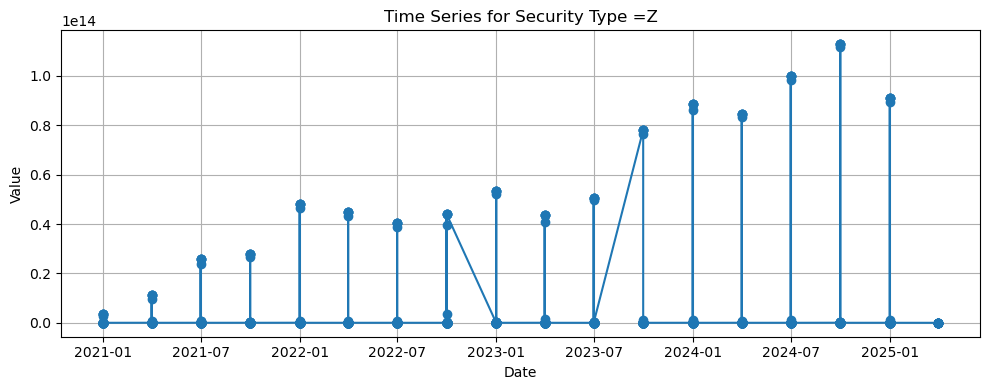

In [11]:
pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in ts_data],
                   columns=['date', 'value'])

# Sort and plot
pdf = pdf.sort_values('date')
plt.figure(figsize=(10, 4))
plt.plot(pdf['date'], pdf['value'], marker='o')
plt.title(f"Time Series for Security Type ={row['SEC_TYPE_CFI']}")
plt.xlabel("Date")
plt.ylabel("Value")
plt.grid(True)
plt.tight_layout()
plt.show()

In [12]:
grouped_rows = grouped.collect()
num_groups = len(grouped_rows)
num_groups

876

IndexError: index 4 is out of bounds for axis 0 with size 4

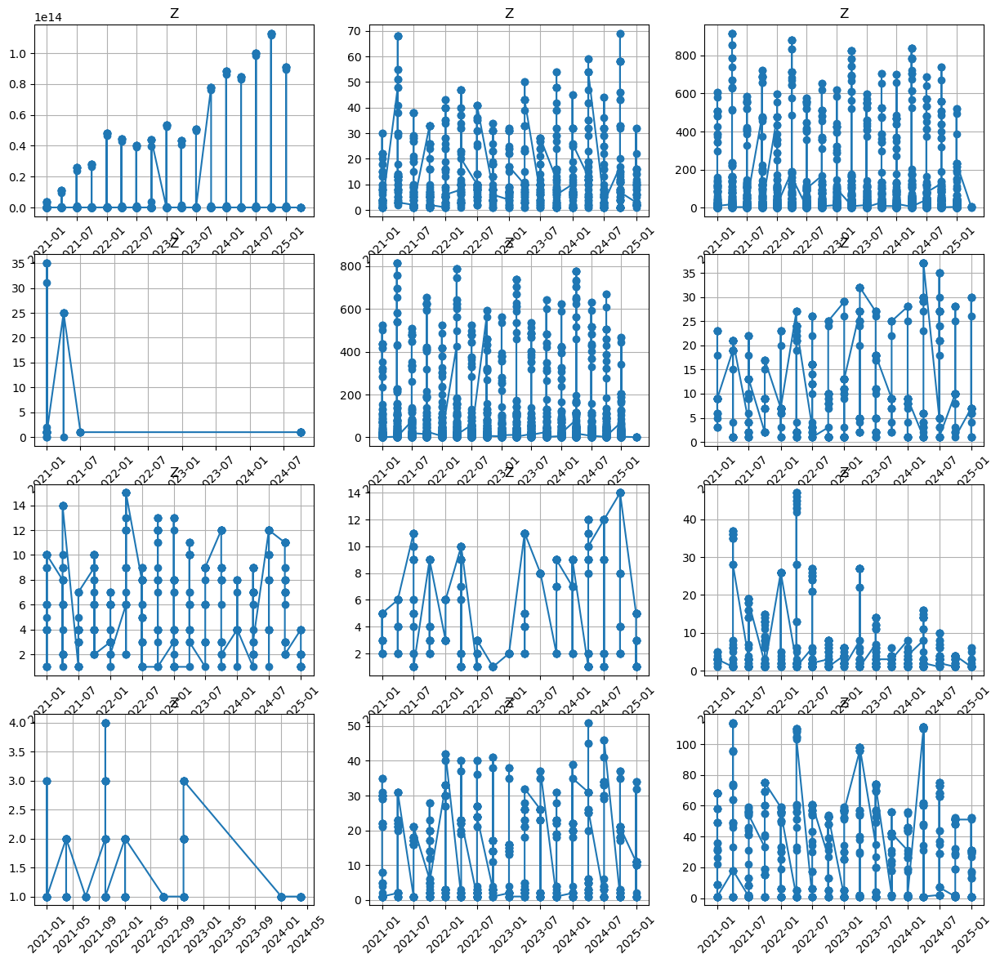

In [13]:
grouped_rows = grouped.collect()
num_groups = len(grouped_rows)
cols = 3
rows = (12 + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 3.5*rows), squeeze=False)

for idx, row in enumerate(grouped_rows[:13]):
    ts_data = row['time_series']
    group_key = f"{row['SEC_TYPE_CFI']}"

    pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in ts_data],
                       columns=['date', 'value']).sort_values('date')

    ax = axes[idx // cols][idx % cols]
    ax.plot(pdf['date'], pdf['value'], marker='o')
    ax.set_title(group_key)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)

for i in range(num_groups, rows * cols):
    fig.delaxes(axes[i // cols][i % cols])

plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
all_data = []

for row in grouped_rows:
    ts = row['time_series']
    sec_type = row['SEC_TYPE_CFI']

    for point in ts:
        all_data.append({
            'date': point['parsed_date'],
            'value': point['OBS_VALUE'],
            'SEC_TYPE_CFI': sec_type,
        })

df_all = pd.DataFrame(all_data)
fig = px.scatter(
    df_all,
    x="date",
    y="value",
    color="SEC_TYPE_CFI",
    title="Interactive Time Series by Security Type",
    labels={"value": "Consideration", "date": "Date"}
)

fig.update_layout(
    width=1000,
    height=600,
    legend=dict(title="Security Type", orientation="v", font=dict(size=10)),
    xaxis=dict(showgrid=True, tickangle=45),
    yaxis=dict(showgrid=True),
    margin=dict(l=40, r=40, t=40, b=40),
)

fig.show()

In [ ]:
group_data = []

for row in grouped_rows:
    sec_type = row['SEC_TYPE_CFI']
    country = row['ISSUER_COU']
    ts = row['time_series']

    pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in ts],
                       columns=['parsed_date', 'OBS_VALUE']).sort_values('parsed_date')
    pdf['SEC_TYPE_CFI'] = sec_type
    pdf['ISSUER_COU'] = country
    group_data.append(pdf)
df_all = pd.concat(group_data, ignore_index=True)

In [ ]:
df_all

,parsed_date,OBS_VALUE,SEC_TYPE_CFI,ISSUER_COU
0,2021-01-01,1.310005e+09,Z,Z
1,2021-01-01,2.900000e+01,Z,Z
2,2021-01-01,1.000000e+00,Z,Z
3,2021-01-01,1.193761e+06,Z,Z
4,2021-01-01,1.000000e+00,Z,Z
...,...,...,...,...
152023,2025-01-01,9.000000e+00,[ZNAV] CFI not available,[V5] EU27
152024,2025-01-01,1.000000e+00,[ZNAV] CFI not available,[V5] EU27
152025,2025-01-01,1.500000e+01,[ZNAV] CFI not available,[V5] EU27
152026,2025-01-01,1.500000e+01,[ZNAV] CFI not available,[V5] EU27


In [ ]:
import warnings
import os
from pmdarima import auto_arima

warnings.filterwarnings("ignore", category=FutureWarning)
os.environ["PYTHONWARNINGS"] = "ignore::FutureWarning"


In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
import numpy as np

def check_stationarity_and_fit(ts_raw, m=4, do_log=True):
    """
    ts_raw : pandas.Series indexed by date
    m      : seasonal period (4 for quarterly)
    do_log : whether to log‐transform first
    """

    # Optional log‐transform
    ts = np.log(ts_raw) if do_log and (ts_raw > 0).all() else ts_raw.copy()
    label = "log" if do_log else "raw"

    # Plot & decompose
    fig, ax = plt.subplots(4,1, figsize=(10,8), sharex=True)
    ts.plot(ax=ax[0], title=f"{label} series")
    res = seasonal_decompose(ts, model='additive', period=m)
    ax[1].plot(res.trend);    ax[1].set_title("Trend")
    ax[2].plot(res.seasonal); ax[2].set_title("Seasonal")
    ax[3].plot(res.resid);    ax[3].set_title("Residual")
    plt.tight_layout(); plt.show()

    # ADF on raw/log series
    p_raw = adfuller(ts.dropna())[1]
    print(f"ADF on {label}: p = {p_raw:.4f}")

    # First difference
    diff1 = ts.diff().dropna()
    p_diff1 = adfuller(diff1)[1]
    print(f"ADF on 1st‐diff: p = {p_diff1:.4f}")

    # Seasonal difference
    diff_seasonal = diff1.diff(m).dropna()
    p_seas = adfuller(diff_seasonal)[1]
    print(f"ADF on (1st‐diff, {m}‐lag diff): p = {p_seas:.4f}")

    # KPSS as a cross-check (stationarity vs. trend stationarity)
    kpss_p = kpss(diff_seasonal, nlags="auto")[1]
    print(f"KPSS on diff_seasonal: p = {kpss_p:.4f}  (want > 0.05)")

    model = auto_arima(
        ts,
        start_p=0, max_p=3,
        start_q=0, max_q=3,
        d=1, D=1,
        seasonal=True, m=m,
        stepwise=True, suppress_warnings=True
    )
    print(model.summary())
    return model

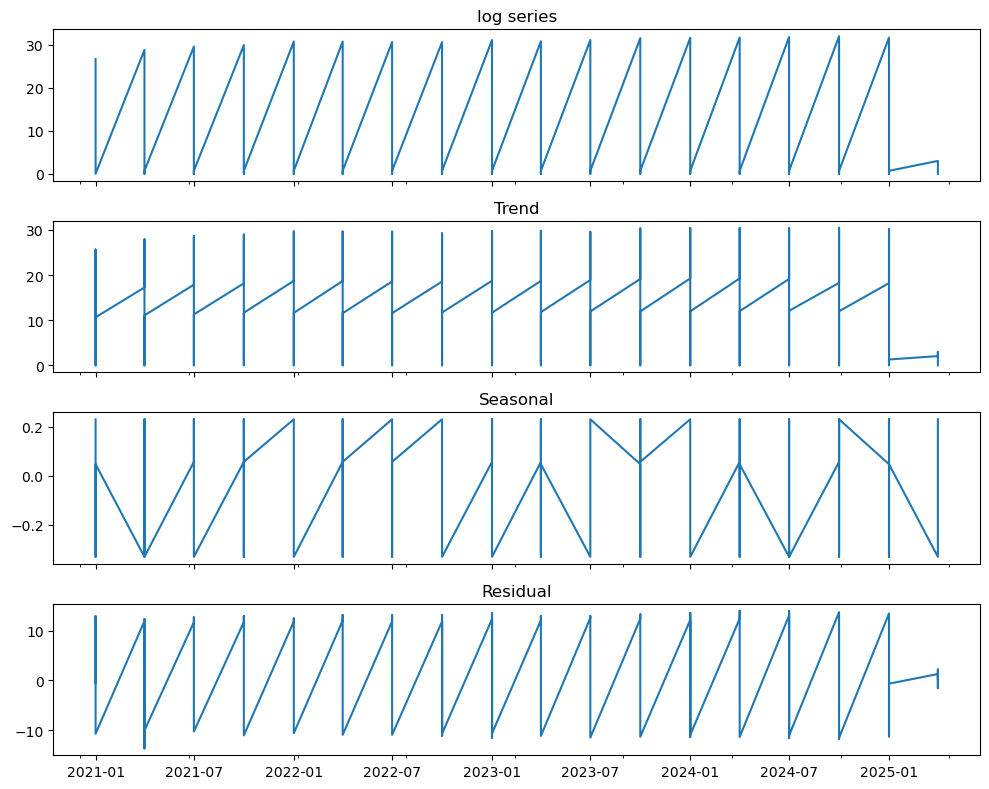

ADF on log: p = 0.0000
ADF on 1st‐diff: p = 0.0000
ADF on (1st‐diff, 4‐lag diff): p = 0.0000
KPSS on diff_seasonal: p = 0.1000  (want > 0.05)


/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_26995/3712897923.py:41: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                 3793
Model:             SARIMAX(3, 1, 0)x(2, 1, 0, 4)   Log Likelihood              -12698.225
Date:                           Wed, 14 May 2025   AIC                          25408.450
Time:                                   16:46:18   BIC                          25445.887
Sample:                                        0   HQIC                         25421.757
                                          - 3793                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1405      0.019     -7.308      0.000      -0.178      -0.103
ar.L2         -0.0724      0.017     -4.207

In [ ]:
row = grouped_rows[0]
pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in row['time_series']],
                   columns=['date','value']).set_index('date')['value'].astype(float)
model = check_stationarity_and_fit(pdf, m=4, do_log=True)

In [ ]:
row = grouped_rows[0]
row

Row(SEC_TYPE_CFI='[RF] Mini-future certificates', FREQ='[Q] quarterly', time_series=[Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=388949246000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=21406828500.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=31330584600.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=121671516000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=340123025000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=866999.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=11749896.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=4177248.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=31330584600.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=9444362200.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=40392663000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=39978156000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=16100256800.0), Row(parsed_date=datetime.dat

25/05/14 19:19:57 WARN HeartbeatReceiver: Removing executor driver with no recent heartbeats: 319604 ms exceeds timeout 120000 ms
25/05/14 19:19:57 WARN SparkContext: Killing executors is not supported by current scheduler.
25/05/14 19:19:58 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at o

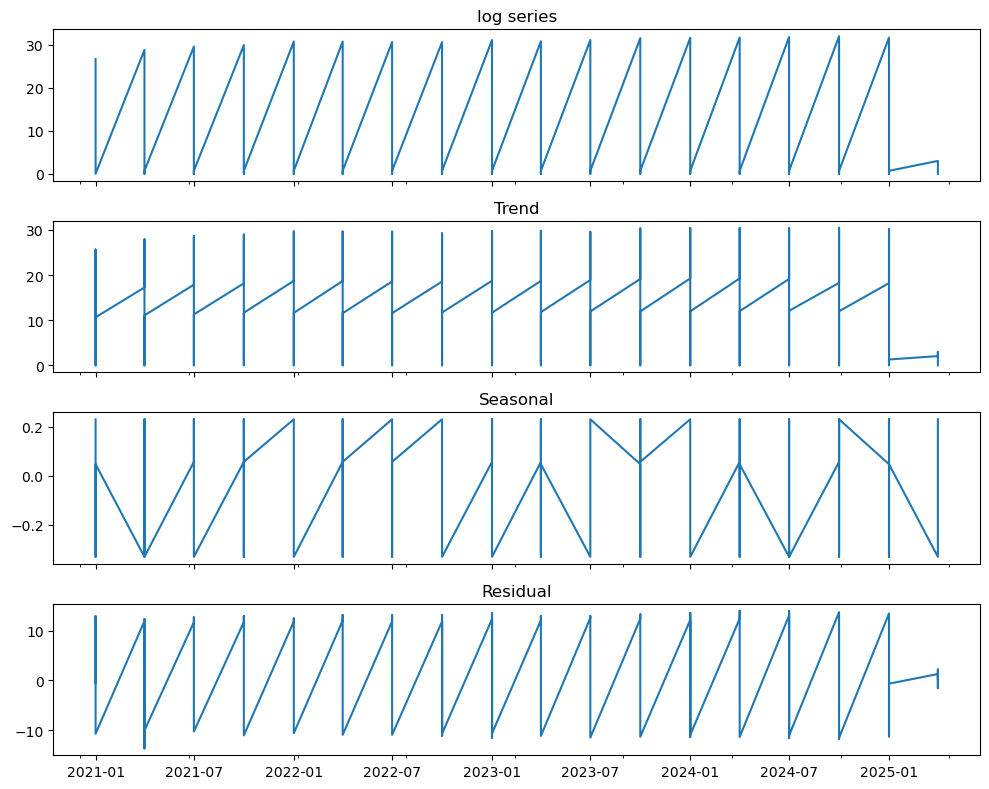

ADF on log: p = 0.0000
ADF on 1st‐diff: p = 0.0000
ADF on (1st‐diff, 4‐lag diff): p = 0.0000
KPSS on diff_seasonal: p = 0.1000  (want > 0.05)


/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_26995/3712897923.py:41: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                 3793
Model:             SARIMAX(3, 1, 0)x(2, 1, 0, 4)   Log Likelihood              -12698.225
Date:                           Wed, 14 May 2025   AIC                          25408.450
Time:                                   19:02:27   BIC                          25445.887
Sample:                                        0   HQIC                         25421.757
                                          - 3793                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1405      0.019     -7.308      0.000      -0.178      -0.103
ar.L2         -0.0724      0.017     -4.207

,date,value,value_log,forecast,residual,is_outlier
date,,,,,,
2021-01-01,2021-01-01,3.889492e+11,26.686715,0.000000,26.686715,False
2021-01-01,2021-01-01,2.140683e+10,23.786976,26.686594,-2.899618,False
2021-01-01,2021-01-01,3.133058e+10,24.167861,23.786977,0.380883,False
2021-01-01,2021-01-01,1.216715e+11,25.524591,24.167906,1.356685,False
2021-01-01,2021-01-01,3.401230e+11,26.552573,38.867941,-12.315368,False


In [ ]:
import numpy as np
import pandas as pd
row = grouped_rows[0]
pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in row['time_series']],
                   columns=['date','value']).set_index('date')['value'].astype(float)

do_log = (pdf > 0).all()
ts = np.log(pdf) if do_log else pdf.copy()
model = check_stationarity_and_fit(pdf, m=4, do_log=True)
fitted_vals = model.predict_in_sample()
residuals = ts - fitted_vals
threshold = 4 * residuals.std()
is_outlier = residuals.abs() > threshold

df_res = pd.DataFrame({
    'date':       ts.index,
    'value':      pdf.values,
    'value_log':  ts.values,
    'forecast':   fitted_vals,
    'residual':   residuals,
    'is_outlier': is_outlier
})
df_res.head()

In [ ]:
model

ARIMA(order=(3, 1, 0), scoring_args={}, seasonal_order=(2, 1, 0, 4),
      suppress_warnings=True, with_intercept=False)

In [ ]:
df =df_res

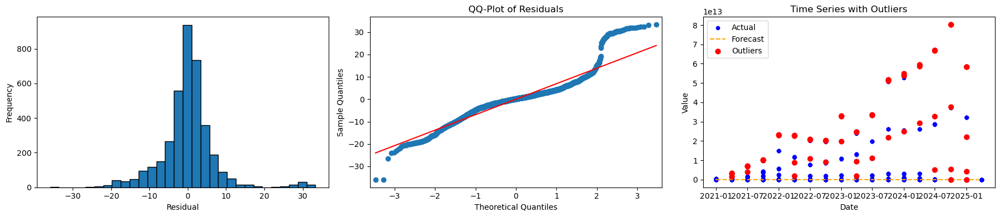

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot


residuals = df['residual']

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].hist(residuals, bins=30, edgecolor='black')

axes[0].set_xlabel("Residual")
axes[0].set_ylabel("Frequency")


qqplot(residuals, line='s', ax=axes[1])
axes[1].set_title("QQ-Plot of Residuals")

axes[2].scatter(df['date'], df['value'], color='blue', s=20, label='Actual')
axes[2].plot(df['date'], df['forecast'], linestyle='--', color='orange', label='Forecast')
axes[2].scatter(
    df[df['is_outlier']]['date'],
    df[df['is_outlier']]['value'],
    color='red', s=40, label='Outliers', zorder=5
)
axes[2].set_title("Time Series with Outliers")
axes[2].set_xlabel("Date")
axes[2].set_ylabel("Value")
axes[2].legend()

plt.tight_layout()
plt.show()

In [ ]:
### kjo nuk me pelqen se ka heavy tails dhe s esht e thjesht q ti besh predict

In [ ]:
def check_and_flag(ts_raw, m=4, do_log=True):


    ts = np.log(ts_raw) if do_log and (ts_raw > 0).all() else ts_raw.copy()
    label = "log" if do_log else "raw"

    # Plot & decompose
    fig, ax = plt.subplots(4,1, figsize=(10,8), sharex=True)
    ts.plot(ax=ax[0], title=f"{label} series")
    res = seasonal_decompose(ts, model='additive', period=m)
    ax[1].plot(res.trend);    ax[1].set_title("Trend")
    ax[2].plot(res.seasonal); ax[2].set_title("Seasonal")
    ax[3].plot(res.resid);    ax[3].set_title("Residual")
    plt.tight_layout(); plt.show()

    # ADF on raw/log series
    p_raw = adfuller(ts.dropna())[1]
    print(f"ADF on {label}: p = {p_raw:.4f}")

    # First difference
    diff1 = ts.diff().dropna()
    p_diff1 = adfuller(diff1)[1]
    print(f"ADF on 1st‐diff: p = {p_diff1:.4f}")

    # Seasonal difference
    diff_seasonal = diff1.diff(m).dropna()
    p_seas = adfuller(diff_seasonal)[1]
    print(f"ADF on (1st‐diff, {m}‐lag diff): p = {p_seas:.4f}")

    # KPSS as a cross-check (stationarity vs. trend stationarity)
    kpss_p = kpss(diff_seasonal, nlags="auto")[1]
    print(f"KPSS on diff_seasonal: p = {kpss_p:.4f}  (want > 0.05)")

    ts = np.log(ts_raw) if do_log and (ts_raw>0).all() else ts_raw.copy()
    ts.name = 'value_log' if do_log else 'value'


    model = auto_arima(
        ts, start_p=0, max_p=3,
        start_q=0, max_q=3,
        d=1, D=1,
        seasonal=True, m=m,
        stepwise=True, suppress_warnings=True
    )

    fitted, ci = model.predict_in_sample(return_conf_int=True, alpha=0.01)
    lower, upper = ci[:,0], ci[:,1]
    outliers = (ts < lower) | (ts > upper)


    df_res = pd.DataFrame({
        'date'       : ts.index,
        'value'      : np.exp(ts) if do_log else ts.values,
        'forecast'   : fitted,
        'lower_ci'   : lower,
        'upper_ci'   : upper,
        'residual'   : ts - fitted,
        'is_outlier' : outliers
    })
    if do_log:
        df_res['value_log'] = ts.values

    return df_res, model

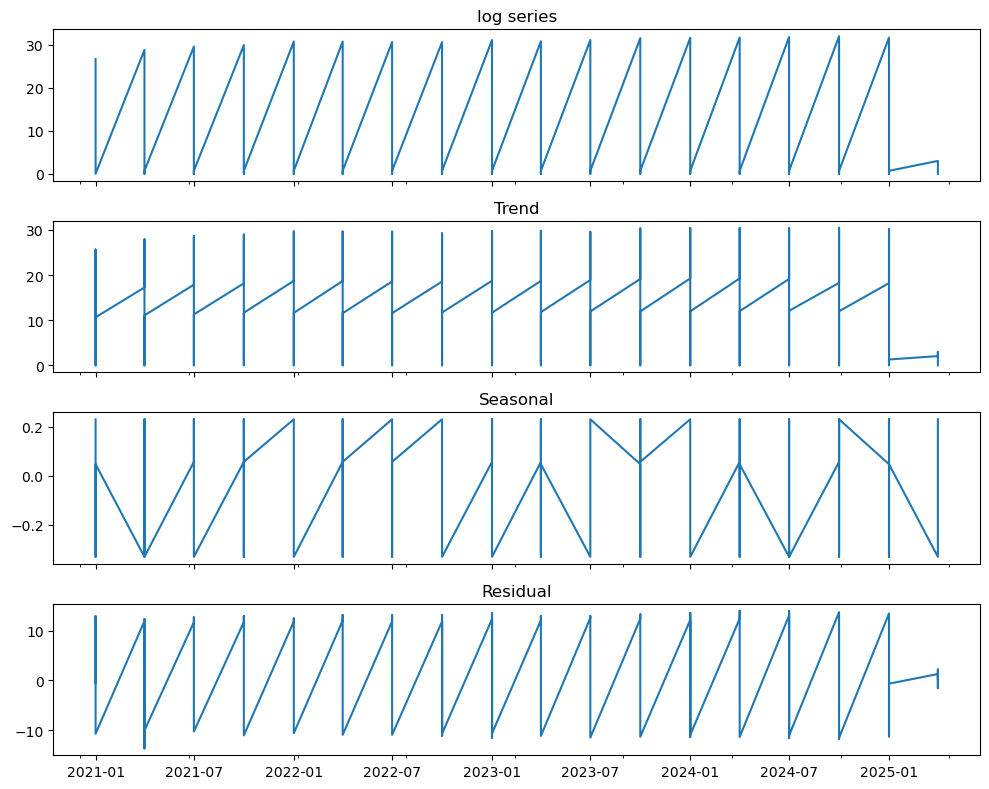

ADF on log: p = 0.0000
ADF on 1st‐diff: p = 0.0000
ADF on (1st‐diff, 4‐lag diff): p = 0.0000
KPSS on diff_seasonal: p = 0.1000  (want > 0.05)


/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_26995/614846663.py:31: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




In [ ]:
row = grouped_rows[0]
pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in row['time_series']],
                   columns=['date','value']).set_index('date')['value'].astype(float)
df_res, model = check_and_flag(pdf, m=4, do_log=True)

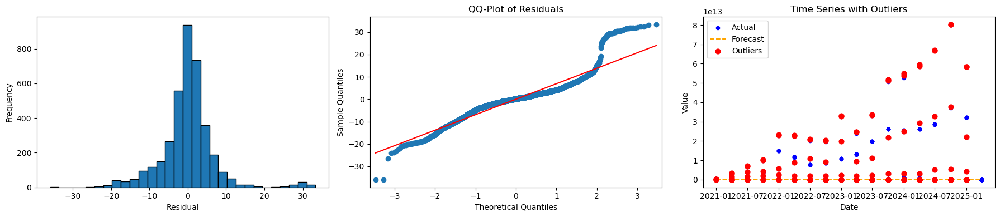

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot

df = df_res
residuals = df['residual']

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].hist(residuals, bins=30, edgecolor='black')

axes[0].set_xlabel("Residual")
axes[0].set_ylabel("Frequency")


qqplot(residuals, line='s', ax=axes[1])
axes[1].set_title("QQ-Plot of Residuals")

axes[2].scatter(df['date'], df['value'], color='blue', s=20, label='Actual')
axes[2].plot(df['date'], df['forecast'], linestyle='--', color='orange', label='Forecast')
axes[2].scatter(
    df[df['is_outlier']]['date'],
    df[df['is_outlier']]['value'],
    color='red', s=40, label='Outliers', zorder=5
)
axes[2].set_title("Time Series with Outliers")
axes[2].set_xlabel("Date")
axes[2].set_ylabel("Value")
axes[2].legend()

plt.tight_layout()
plt.show()

In [ ]:
###perdor me shume segregime sepse do bej me shume sens. do ta shofi nqs ky debti q esht quajt si outlier esht meverte outlier apo jo ne shtetin e vet.
# dhe pastaj beje plotin per gjith shtetet

In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from pmdarima import auto_arima
from statsmodels.tsa.stattools import adfuller, kpss
from joblib import Parallel, delayed

def check_stationarity_and_fit(ts_raw, m=4, do_log=True):
    ts = np.log(ts_raw) if do_log and (ts_raw > 0).all() else ts_raw.copy()

    model = auto_arima(
        ts, start_p=0, max_p=3, start_q=0, max_q=3,
        d=1, D=1, seasonal=True, m=m,
        stepwise=True, suppress_warnings=True
    )
    return model, ts

def detect_outliers_in_group(df_group, seasonal_period=4, log_thresh=0.05, std_thresh=4):
    ts_raw = df_group.set_index('parsed_date')['OBS_VALUE'].astype(float).sort_index()
    if len(ts_raw) < 12:
        return None  # too short for seasonal modeling

    try:
        model, ts = check_stationarity_and_fit(ts_raw, m=seasonal_period, do_log=True)
        fitted_vals = model.predict_in_sample()
        residuals = ts - fitted_vals
        abs_res = residuals.abs()

        # Apply statistical and practical threshold
        threshold = std_thresh * residuals.std()
        is_outlier = (abs_res > threshold) & (abs_res > log_thresh * ts_raw)

        return pd.DataFrame({
            'issuer_cou': df_group['ISSUER_COU'].iloc[0],
            'sec_type_cfi': df_group['SEC_TYPE_CFI'].iloc[0],
            'date': ts.index,
            'value': ts_raw.values,
            'value_log': ts.values,
            'forecast': fitted_vals,
            'residual': residuals,
            'is_outlier': is_outlier
        })

    except Exception as e:
        print(f"[ERROR] {df_group['ISSUER_COU'].iloc[0]} - {df_group['SEC_TYPE_CFI'].iloc[0]}: {e}")
        return None

In [ ]:
from tqdm import tqdm

results = []
grouped = df_all.groupby(['ISSUER_COU', 'SEC_TYPE_CFI'])

for (key, group) in tqdm(grouped, total=grouped.ngroups, desc="Processing groups"):
    result_df = detect_outliers_in_group(group)
    if result_df is not None:
        results.append(result_df)

df_all_outliers = pd.concat(results, ignore_index=True)

Processing groups:   6%|▌         | 49/876 [07:51<3:28:14, 15.11s/it]/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pmdarima/arima/auto.py:444: UserWarning:

Input time-series is completely constant; returning a (0, 0, 0) ARMA.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pmdarima/arima/auto.py:444: UserWarning:

Input time-series is completely constant; returning a (0, 0, 0) ARMA.

Processing groups:   6%|▋         | 55/876 [07:53<59:08,  4.32s/it]  /opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pmdarima/arima/auto.py:444: UserWarning:

Input time-series is completely constant; returning a (0, 0, 0) ARMA.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pmdarima/arima/auto.py:444: UserWarning:

Input time-series is completely constant; returning a (0, 0, 0) ARMA.

Processing groups:  16%|█▌        | 137/876 [09:49<04:07,  2.98it/s]/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pmdarima/arima/auto.py:444: UserWarning:

Input time-seri

In [ ]:
df_all_outliers

,issuer_cou,sec_type_cfi,date,value,value_log,forecast,residual,is_outlier
0,Z,Z,2021-01-01,1.310005e+09,1.310005e+09,0.000000e+00,1.310005e+09,False
1,Z,Z,2021-01-01,2.900000e+01,2.900000e+01,6.000450e+08,-6.000449e+08,False
2,Z,Z,2021-01-01,1.000000e+00,1.000000e+00,4.648845e+08,-4.648845e+08,False
3,Z,Z,2021-01-01,1.193761e+06,1.193761e+06,5.914874e+08,-5.902937e+08,False
4,Z,Z,2021-01-01,1.000000e+00,1.000000e+00,9.407045e+08,-9.407045e+08,False
...,...,...,...,...,...,...,...,...
150778,[V5] EU27,[ZNAV] CFI not available,2025-01-01,9.000000e+00,2.197225e+00,-6.694992e-02,2.264174e+00,False
150779,[V5] EU27,[ZNAV] CFI not available,2025-01-01,1.000000e+00,0.000000e+00,8.138793e-01,-8.138793e-01,False
150780,[V5] EU27,[ZNAV] CFI not available,2025-01-01,1.500000e+01,2.708050e+00,2.881598e+00,-1.735481e-01,False
150781,[V5] EU27,[ZNAV] CFI not available,2025-01-01,1.500000e+01,2.708050e+00,1.343375e+00,1.364675e+00,False


In [ ]:
k = df_all_outliers.drop(['is_outlier','residual','forecast','value_log'],axis=1)
k

,issuer_cou,sec_type_cfi,date,value
0,Z,Z,2021-01-01,1.310005e+09
1,Z,Z,2021-01-01,2.900000e+01
2,Z,Z,2021-01-01,1.000000e+00
3,Z,Z,2021-01-01,1.193761e+06
4,Z,Z,2021-01-01,1.000000e+00
...,...,...,...,...
150778,[V5] EU27,[ZNAV] CFI not available,2025-01-01,9.000000e+00
150779,[V5] EU27,[ZNAV] CFI not available,2025-01-01,1.000000e+00
150780,[V5] EU27,[ZNAV] CFI not available,2025-01-01,1.500000e+01
150781,[V5] EU27,[ZNAV] CFI not available,2025-01-01,1.500000e+01


In [ ]:
k['sec_type_cfi'].value_counts()

sec_type_cfi
Z                                                 30992
[ZALL] All records if applicable                  12326
[SCRT] Securities                                 12291
[D] Debt                                          11207
[DB] Bonds                                         9587
[E] Equity                                         8385
[ES] Shares                                        6545
[DT] MTN                                           6280
[R] Entitlement (rights)                           5184
[DE] Structured debt (no capital protection)       4835
[RW] Warrants                                      4494
[EY] Structured instruments (participation)        4300
[DS] Structured debt (capital protection)          3901
[RF] Mini-future certificates                      3763
[DA] ABS                                           3729
[DM] Other debt                                    2772
[DY] MMI                                           2749
[DG] MBS                           

In [ ]:
debt = k[k['sec_type_cfi']=="[D] Debt"]
debt

,issuer_cou,sec_type_cfi,date,value
22169,Z,[D] Debt,2021-01-01,164675200.0
22170,Z,[D] Debt,2021-01-01,11.0
22171,Z,[D] Debt,2021-01-01,2.0
22172,Z,[D] Debt,2021-01-01,38.0
22173,Z,[D] Debt,2021-01-01,79.0
...,...,...,...,...
147319,[V5] EU27,[D] Debt,2025-04-01,2.0
147320,[V5] EU27,[D] Debt,2025-04-01,2.0
147321,[V5] EU27,[D] Debt,2025-04-01,2.0
147322,[V5] EU27,[D] Debt,2025-04-01,2.0


In [ ]:
nl_debt = debt[debt['issuer_cou']=='[NL] Netherlands']
nl_debt

,issuer_cou,sec_type_cfi,date,value
121796,[NL] Netherlands,[D] Debt,2021-01-01,1.0
121797,[NL] Netherlands,[D] Debt,2021-01-01,1.0
121798,[NL] Netherlands,[D] Debt,2021-01-01,36.0
121799,[NL] Netherlands,[D] Debt,2021-01-01,37.0
121800,[NL] Netherlands,[D] Debt,2021-01-01,11.0
...,...,...,...,...
121966,[NL] Netherlands,[D] Debt,2025-04-01,1.0
121967,[NL] Netherlands,[D] Debt,2025-04-01,1.0
121968,[NL] Netherlands,[D] Debt,2025-04-01,1.0
121969,[NL] Netherlands,[D] Debt,2025-04-01,1.0


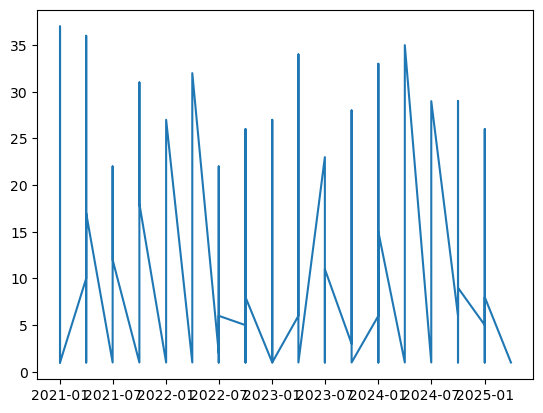

In [ ]:
plt.plot(nl_debt['date'],nl_debt['value'])

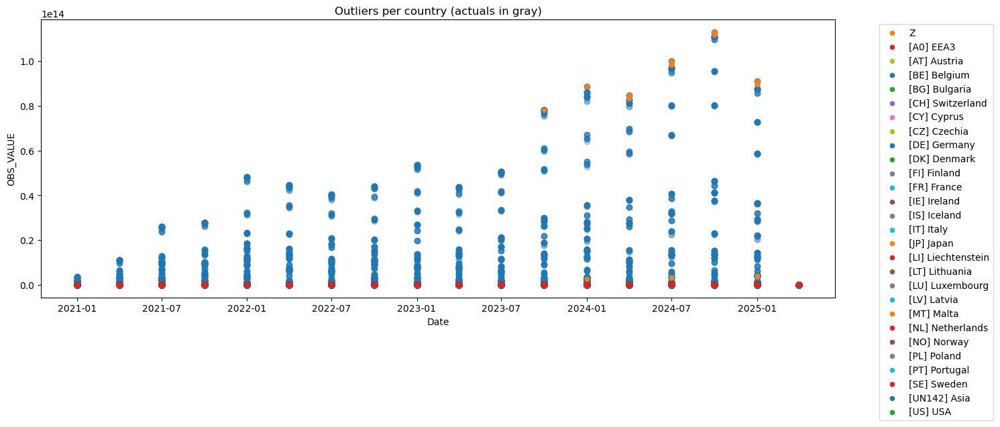

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))
countries = df_all_outliers['issuer_cou'].unique()

for country in countries:
    sub = df_all_outliers[df_all_outliers['issuer_cou'] == country]

    # Actuals in light gray
    plt.scatter(sub['date'], sub['value'], alpha=0.3, label=None)

    # Outliers in red
    out = sub[sub['is_outlier']]
    if not out.empty:
        plt.scatter(out['date'], out['value'], s=20, label=country)

plt.title("Outliers per country (actuals in gray)")
plt.xlabel("Date")
plt.ylabel("OBS_VALUE")
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

In [ ]:
row = grouped_rows[0]
row

Row(SEC_TYPE_CFI='Z', ISSUER_COU='Z', time_series=[Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1310004990.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1130444670.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=100446208000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=489361375000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=2097586300.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=677652860.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=38.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=61.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1149.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=12.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=14.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1335284.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=2711631950000.0), Row(parsed_date=datetime.date(2021, 1, 1), OBS_VALUE=1036725760.0), Row(parsed_date=datetime.date(20

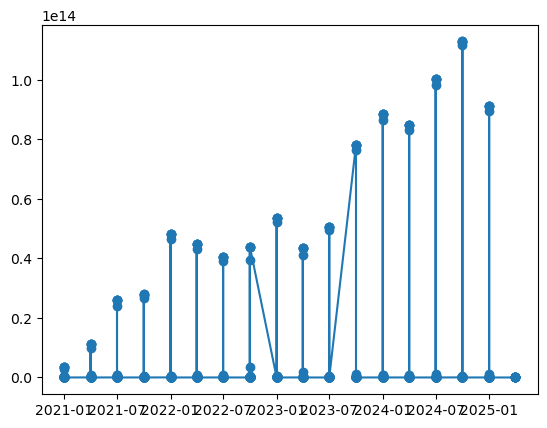

In [ ]:
ts_data = row['time_series']
group_key = f"{row['SEC_TYPE_CFI']}"

pdf = pd.DataFrame([(r['parsed_date'], r['OBS_VALUE']) for r in ts_data],
                       columns=['date', 'value']).sort_values('date')
plt.plot(pdf['date'], pdf['value'], marker='o')

In [4]:
a = df_joined.toPandas()
a

25/05/21 13:23:11 WARN TaskSetManager: Stage 6 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


,KEY,TITLE,TITLE_COMPL,PROSP3_MEASURE,FREQ,S_NCA,PROSP3_SECURITIES_TYPE,MTR,CURR_ISSNC,PROSP3_OFFER_TYPE,...,PROSP3_PRSP_TYPE,PROSP3_SME_CAT_TYPE,PROSP3_PSSP,PROSP3_VENUE,PROSP3_LNGG,MV,GROUP,TIME_PERIOD,PK,OBS_VALUE
0,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.C.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed CIIs ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q3,6.786070e+11,9768010.0
1,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.C.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed CIIs ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q4,8.246360e+11,49695368.0
2,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.C.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed CIIs ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q1,2.662900e+11,20708856.0
3,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.C.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed CIIs ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q4,4.294990e+11,22089260.0
4,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.C.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed CIIs ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2024-Q4,8.160470e+11,25000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152023,PROSP3.NUM_PRSP.Q.V5.ZNAV.Z.Z.Z.Z.Z.A6.Z.Z.Z.Z...,Quarterly number of prospectuses on instrument...,NaN,[NUM_PRSP] Number of prospectuses,[Q] quarterly,[V5] EU27,[ZNAV] Securities type not available,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_PRSP.Q.Y.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z,2021-Q1,8.504110e+11,1.0
152024,PROSP3.NUM_PRSP.Q.V5.ZNAV.Z.Z.Z.Z.Z.A6.Z.Z.Z.Z...,Quarterly number of prospectuses on instrument...,NaN,[NUM_PRSP] Number of prospectuses,[Q] quarterly,[V5] EU27,[ZNAV] Securities type not available,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_PRSP.Q.Y.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z,2021-Q4,5.841240e+11,1.0
152025,PROSP3.NUM_PRSP.Q.V5.ZNAV.Z.Z.Z.Z.Z.A6.Z.Z.Z.Z...,Quarterly number of prospectuses on instrument...,NaN,[NUM_PRSP] Number of prospectuses,[Q] quarterly,[V5] EU27,[ZNAV] Securities type not available,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_PRSP.Q.Y.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z,2022-Q3,8.590910e+10,1.0
152026,PROSP3.NUM_PRSP.Q.V5.ZNAV.Z.Z.Z.Z.Z.DK.Z.Z.Z.Z...,Quarterly number of prospectuses on instrument...,NaN,[NUM_PRSP] Number of prospectuses,[Q] quarterly,[V5] EU27,[ZNAV] Securities type not available,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_PRSP.Q.Y.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z,2024-Q2,8.074650e+11,1.0


In [15]:
debt = a[a['SEC_TYPE_CFI']=="[D] Debt"]
debt

,KEY,TITLE,TITLE_COMPL,PROSP3_MEASURE,FREQ,S_NCA,PROSP3_SECURITIES_TYPE,MTR,CURR_ISSNC,PROSP3_OFFER_TYPE,...,PROSP3_PRSP_TYPE,PROSP3_SME_CAT_TYPE,PROSP3_PSSP,PROSP3_VENUE,PROSP3_LNGG,MV,GROUP,TIME_PERIOD,PK,OBS_VALUE
7,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q1,7.387360e+11,2.483136e+08
8,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2023-Q4,2.748810e+11,1.601566e+09
9,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2024-Q3,7.645060e+11,2.860072e+09
10,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q4,8.246360e+11,1.100916e+09
11,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A0] EEA3,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q1,2.662900e+11,1.042032e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148195,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.D.V5.Z.Z.Z.Z....,Quarterly number of issuers of Debt from EU27 ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[V5] EU27,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2022-Q4,4.552760e+11,4.140000e+02
148196,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.D.V5.Z.Z.Z.Z....,Quarterly number of issuers of Debt from EU27 ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[V5] EU27,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2023-Q3,2.577611e+10,4.000000e+02
148197,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.D.V5.Z.Z.Z.Z....,Quarterly number of issuers of Debt from EU27 ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[V5] EU27,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2024-Q4,4.037360e+11,4.780000e+02
148198,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.D.V5.Z.Z.Z.Z....,Quarterly number of issuers of Debt from EU27 ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[V5] EU27,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2025-Q1,2.405260e+11,3.910000e+02


In [16]:
nl_debt = debt[debt['S_NCA']=='[NL] Netherlands']
nl_debt

,KEY,TITLE,TITLE_COMPL,PROSP3_MEASURE,FREQ,S_NCA,PROSP3_SECURITIES_TYPE,MTR,CURR_ISSNC,PROSP3_OFFER_TYPE,...,PROSP3_PRSP_TYPE,PROSP3_SME_CAT_TYPE,PROSP3_PSSP,PROSP3_VENUE,PROSP3_LNGG,MV,GROUP,TIME_PERIOD,PK,OBS_VALUE
6639,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly number of filed Debt in Netherlands,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q3,7.559190e+11,339.0
6640,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly number of filed Debt in Netherlands,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2023-Q1,2.491130e+11,725.0
6641,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly number of filed Debt in Netherlands,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q1,3.006540e+11,373.0
6642,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly number of filed Debt in Netherlands,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q4,2.491130e+11,75.0
6643,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly number of filed Debt in Netherlands,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q1,4.037320e+11,284.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140114,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,Quarterly number of filed Debt in Netherlands ...,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Y.Z.Z.Z.Z.Z.Z,2023-Q4,4.982220e+11,1.0
140115,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,Quarterly number of filed Debt in Netherlands ...,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Y.Z.Z.Z.Z.Z.Z,2023-Q1,6.013000e+11,1.0
140116,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,Quarterly number of filed Debt in Netherlands ...,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Y.Z.Z.Z.Z.Z.Z,2022-Q3,3.092440e+11,3.0
140117,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,Quarterly number of filed Debt in Netherlands ...,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Y.Z.Z.Z.Z.Z.Z,2024-Q2,7.043810e+11,9.0


In [17]:
df = nl_debt

In [18]:
df.groupby(['TITLE', 'TIME_PERIOD']).size().reset_index(name='count').query('count > 1')

,TITLE,TIME_PERIOD,count
22,Quarterly consideration offered of filed Debt ...,2022-Q2,2
25,Quarterly consideration offered of filed Debt ...,2023-Q1,2
26,Quarterly consideration offered of filed Debt ...,2023-Q2,2
29,Quarterly consideration offered of filed Debt ...,2024-Q1,2
31,Quarterly consideration offered of filed Debt ...,2024-Q3,2
96,Quarterly number of filed Debt in Netherlands ...,2021-Q1,2
98,Quarterly number of filed Debt in Netherlands ...,2021-Q3,2
100,Quarterly number of filed Debt in Netherlands ...,2022-Q1,2
101,Quarterly number of filed Debt in Netherlands ...,2022-Q2,2
102,Quarterly number of filed Debt in Netherlands ...,2022-Q3,2


In [19]:
sample = df[(df['TITLE'].str.startswith('Quarterly number of filed Debt in Netherlands')) &
            (df['TIME_PERIOD'] == '2023-Q1')]

sample = sample.reset_index(drop=True)
all_equal_except_obs = sample.drop(columns=['OBS_VALUE']).nunique().max() == 1
print("All other columns identical:", all_equal_except_obs)
print("OBS_VALUEs:", sample['OBS_VALUE'].tolist())

All other columns identical: False
OBS_VALUEs: [725.0, 720.0, 724.0, 3.0, 1.0, 1.0]


In [20]:
conflicting = df.groupby(['TITLE', 'TIME_PERIOD']).filter(lambda x: len(x) > 1)

In [21]:
sample = conflicting[(conflicting['TITLE'] == 'Quarterly number of filed Debt in Netherlands') &
                     (conflicting['TIME_PERIOD'] == '2023-Q1')]
diff_cols = sample.loc[:, sample.nunique(dropna=False) > 1].columns.tolist()
print("Columns that differ:", diff_cols)
sample[diff_cols]

Columns that differ: []


""


In [22]:
conflicting_rows = df.groupby(['TITLE', 'TIME_PERIOD']).filter(lambda x: len(x) > 1)
from collections import defaultdict

diff_report = defaultdict(list)
for (title, time), group in conflicting_rows.groupby(['TITLE', 'TIME_PERIOD']):
    varying_cols = group.loc[:, group.nunique(dropna=False) > 1].columns.tolist()
    diff_report[(title, time)] = varying_cols

diff_df = pd.DataFrame([
    {'TITLE': k[0], 'TIME_PERIOD': k[1], 'DIFFERING_COLUMNS': v}
    for k, v in diff_report.items()
])

diff_df

,TITLE,TIME_PERIOD,DIFFERING_COLUMNS
0,Quarterly consideration offered of filed Debt ...,2022-Q2,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
1,Quarterly consideration offered of filed Debt ...,2023-Q1,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
2,Quarterly consideration offered of filed Debt ...,2023-Q2,"[KEY, ISSUER_SECTOR, PK, OBS_VALUE]"
3,Quarterly consideration offered of filed Debt ...,2024-Q1,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
4,Quarterly consideration offered of filed Debt ...,2024-Q3,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
5,Quarterly number of filed Debt in Netherlands ...,2021-Q1,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
6,Quarterly number of filed Debt in Netherlands ...,2021-Q3,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
7,Quarterly number of filed Debt in Netherlands ...,2022-Q1,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
8,Quarterly number of filed Debt in Netherlands ...,2022-Q2,"[KEY, ISSUER_SECTOR, OBS_VALUE]"
9,Quarterly number of filed Debt in Netherlands ...,2022-Q3,"[KEY, ISSUER_SECTOR, OBS_VALUE]"


In [23]:
detailed_diffs = []

for _, row in diff_df.iterrows():
    title = row['TITLE']
    time_period = row['TIME_PERIOD']
    diff_cols = row['DIFFERING_COLUMNS']
    group = df[(df['TITLE'] == title) & (df['TIME_PERIOD'] == time_period)]
    if group.empty:
        continue

    subset = group[diff_cols].copy()
    subset['TITLE'] = title
    subset['TIME_PERIOD'] = time_period

    detailed_diffs.append(subset)

detailed_result_df = pd.concat(detailed_diffs, ignore_index=True)

In [24]:
detailed_result_df

,KEY,ISSUER_SECTOR,OBS_VALUE,TITLE,TIME_PERIOD,PK
0,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL.Z.Z.Z.Z.Z.Z,[ZALL] All sectors,1.805510e+10,Quarterly consideration offered of filed Debt ...,2022-Q2,NaN
1,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL_OTHR.Z.Z.Z.Z...,[ZALL_OTHR] All sectors,6.750000e+06,Quarterly consideration offered of filed Debt ...,2022-Q2,NaN
2,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL.Z.Z.Z.Z.Z.Z,[ZALL] All sectors,3.866336e+10,Quarterly consideration offered of filed Debt ...,2023-Q1,NaN
3,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL_OTHR.Z.Z.Z.Z...,[ZALL_OTHR] All sectors,3.608930e+07,Quarterly consideration offered of filed Debt ...,2023-Q1,NaN
4,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL.Z.Z.Z.Z.Z.Z,[ZALL] All sectors,6.619472e+10,Quarterly consideration offered of filed Debt ...,2023-Q2,2.577165e+10
5,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL_OTHR.Z.Z.Z.Z...,[ZALL_OTHR] All sectors,1.115000e+07,Quarterly consideration offered of filed Debt ...,2023-Q2,2.577165e+10
6,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL.Z.Z.Z.Z.Z.Z,[ZALL] All sectors,2.655292e+10,Quarterly consideration offered of filed Debt ...,2024-Q1,NaN
7,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL_OTHR.Z.Z.Z.Z...,[ZALL_OTHR] All sectors,5.000000e+06,Quarterly consideration offered of filed Debt ...,2024-Q1,NaN
8,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL.Z.Z.Z.Z.Z.Z,[ZALL] All sectors,2.522902e+10,Quarterly consideration offered of filed Debt ...,2024-Q3,NaN
9,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.ZALL_OTHR.Z.Z.Z.Z...,[ZALL_OTHR] All sectors,2.000000e+06,Quarterly consideration offered of filed Debt ...,2024-Q3,NaN


In [25]:
columns_to_show = ['KEY', 'ISSUER_SECTOR', 'PK', 'OBS_VALUE']
full_detailed_diffs = []
for (title, time_period), group in df.groupby(['TITLE', 'TIME_PERIOD']):
    subset = group[columns_to_show].copy()
    subset['TITLE'] = title
    subset['TIME_PERIOD'] = time_period
    subset = subset[['TITLE', 'TIME_PERIOD'] + columns_to_show]

    full_detailed_diffs.append(subset)
detailed_full_df = pd.concat(full_detailed_diffs, ignore_index=True)

#### here im grouping by title and time period so debt will be one thing per quarter but i dont think its a good approach.


In [26]:
detailed_full_df

,TITLE,TIME_PERIOD,KEY,ISSUER_SECTOR,PK,OBS_VALUE
0,Quarterly consideration offered of filed Debt ...,2021-Q1,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,7.387360e+11,3.110824e+10
1,Quarterly consideration offered of filed Debt ...,2021-Q2,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,2.662900e+11,1.015964e+10
2,Quarterly consideration offered of filed Debt ...,2021-Q3,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,6.786070e+11,7.658571e+09
3,Quarterly consideration offered of filed Debt ...,2021-Q4,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,8.246360e+11,2.059371e+10
4,Quarterly consideration offered of filed Debt ...,2022-Q1,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,2.662900e+11,2.655723e+10
...,...,...,...,...,...,...
239,Quarterly number of issuers of Debt from World...,2024-Q1,PROSP3.NUM_ISSUER.Q.NL.Z.Z.Z.Z.Z.D.A1.Z.Z.Z.Z....,Z,6.013030e+11,1.500000e+01
240,Quarterly number of issuers of Debt from World...,2024-Q2,PROSP3.NUM_ISSUER.Q.NL.Z.Z.Z.Z.Z.D.A1.Z.Z.Z.Z....,Z,3.693740e+11,2.100000e+01
241,Quarterly number of issuers of Debt from World...,2024-Q3,PROSP3.NUM_ISSUER.Q.NL.Z.Z.Z.Z.Z.D.A1.Z.Z.Z.Z....,Z,6.184810e+11,1.300000e+01
242,Quarterly number of issuers of Debt from World...,2024-Q4,PROSP3.NUM_ISSUER.Q.NL.Z.Z.Z.Z.Z.D.A1.Z.Z.Z.Z....,Z,4.037360e+11,1.500000e+01


In [27]:
cols_to_show = ['TITLE', 'TIME_PERIOD', 'KEY', 'ISSUER_SECTOR', 'OBS_VALUE']

ai = nl_debt[cols_to_show]
ai

,TITLE,TIME_PERIOD,KEY,ISSUER_SECTOR,OBS_VALUE
6639,Quarterly number of filed Debt in Netherlands,2021-Q3,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,339.0
6640,Quarterly number of filed Debt in Netherlands,2023-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,725.0
6641,Quarterly number of filed Debt in Netherlands,2022-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,373.0
6642,Quarterly number of filed Debt in Netherlands,2022-Q4,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,75.0
6643,Quarterly number of filed Debt in Netherlands,2021-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Z,284.0
...,...,...,...,...,...
140114,Quarterly number of filed Debt in Netherlands ...,2023-Q4,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,[ZNAV] Sector not available,1.0
140115,Quarterly number of filed Debt in Netherlands ...,2023-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,[ZNAV] Sector not available,1.0
140116,Quarterly number of filed Debt in Netherlands ...,2022-Q3,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,[ZNAV] Sector not available,3.0
140117,Quarterly number of filed Debt in Netherlands ...,2024-Q2,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.ZNAV.Z.Z.Z...,[ZNAV] Sector not available,9.0


In [28]:
ai['ISSUER_SECTOR'].value_counts()

ISSUER_SECTOR
Z                               102
[S12] Financial corporations     34
[ZALL] All sectors               34
[S11] Non-financial              30
[ZNAV] Sector not available      26
[ZALL_OTHR] All sectors          18
Name: count, dtype: int64

In [29]:
fs = ai[ai['ISSUER_SECTOR']=='[S12] Financial corporations']
fs

,TITLE,TIME_PERIOD,KEY,ISSUER_SECTOR,OBS_VALUE
25474,Quarterly number of filed Debt in Netherlands ...,2021-Q2,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,2.390000e+02
25475,Quarterly number of filed Debt in Netherlands ...,2025-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,5.530000e+02
25476,Quarterly number of filed Debt in Netherlands ...,2022-Q4,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,7.100000e+01
25477,Quarterly number of filed Debt in Netherlands ...,2023-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,7.200000e+02
25478,Quarterly number of filed Debt in Netherlands ...,2024-Q3,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,5.320000e+02
25479,Quarterly number of filed Debt in Netherlands ...,2024-Q2,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,3.300000e+02
25480,Quarterly number of filed Debt in Netherlands ...,2021-Q3,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,3.380000e+02
25481,Quarterly number of filed Debt in Netherlands ...,2022-Q3,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,2.320000e+02
25482,Quarterly number of filed Debt in Netherlands ...,2024-Q1,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,5.250000e+02
25483,Quarterly number of filed Debt in Netherlands ...,2024-Q4,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.D.Z.S12.Z.Z.Z....,[S12] Financial corporations,2.010000e+02


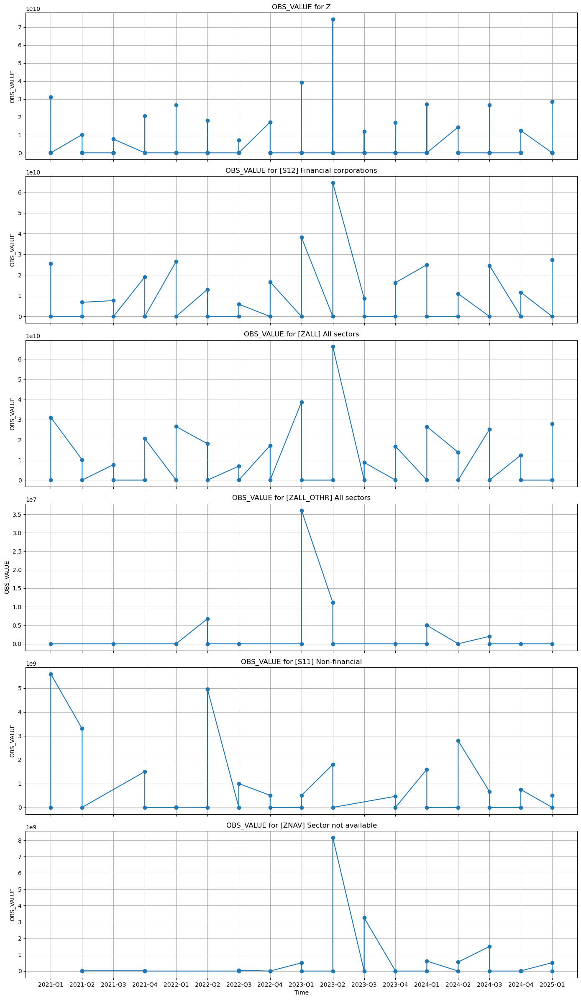

In [30]:
unique_sectors = df['ISSUER_SECTOR'].unique()
n_sectors = len(unique_sectors)
fig, axes = plt.subplots(n_sectors, 1, figsize=(14, 4 * n_sectors), sharex=True)
if n_sectors == 1:
    axes = [axes]
for ax, sector in zip(axes, unique_sectors):
    sector_df = df[df['ISSUER_SECTOR'] == sector].sort_values('TIME_PERIOD')
    ax.plot(sector_df['TIME_PERIOD'], sector_df['OBS_VALUE'], marker='o')
    ax.set_title(f'OBS_VALUE for {sector}')
    ax.set_ylabel('OBS_VALUE')
    ax.grid(True)

axes[-1].set_xlabel('Time')
plt.tight_layout()
plt.show()

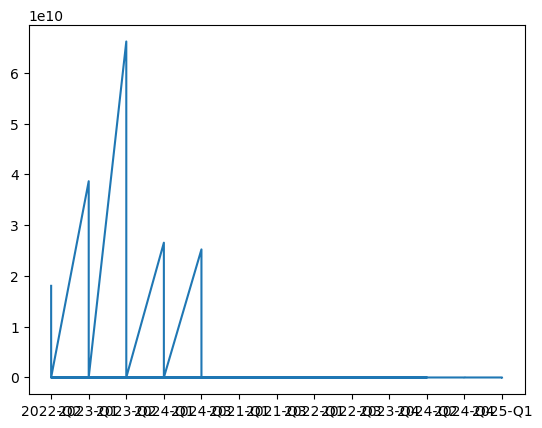

In [31]:
plt.plot(detailed_result_df['TIME_PERIOD'],detailed_result_df['OBS_VALUE'])

## 2. Plot

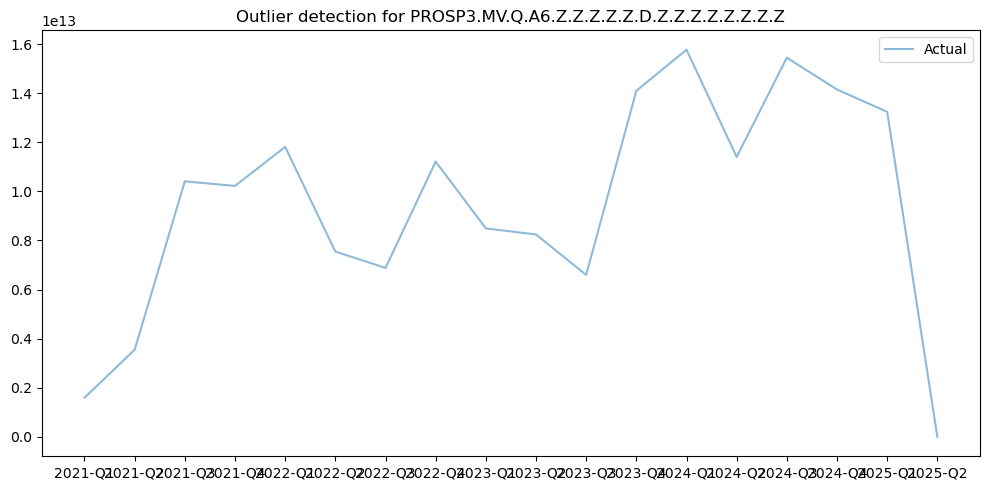

In [32]:
key = 'PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z'
sub = a[a['KEY'] == key]
sub = sub.sort_values('TIME_PERIOD')

plt.figure(figsize=(10,5))
plt.plot(sub['TIME_PERIOD'], sub['OBS_VALUE'], label='Actual', alpha=0.5)
plt.title(f'Outlier detection for {key}')
plt.legend()
plt.tight_layout()
plt.show()

In [33]:
sub

,KEY,TITLE,TITLE_COMPL,PROSP3_MEASURE,FREQ,S_NCA,PROSP3_SECURITIES_TYPE,MTR,CURR_ISSNC,PROSP3_OFFER_TYPE,...,PROSP3_PRSP_TYPE,PROSP3_SME_CAT_TYPE,PROSP3_PSSP,PROSP3_VENUE,PROSP3_LNGG,MV,GROUP,TIME_PERIOD,PK,OBS_VALUE
38523,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q1,7.387360e+11,1.594851e+12
38519,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q2,2.662900e+11,3.550793e+12
38524,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q3,6.786070e+11,1.041065e+13
38516,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q4,8.246360e+11,1.022223e+13
38531,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q1,2.662900e+11,1.181308e+13
38520,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q2,5.583490e+11,7.550089e+12
38526,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q3,4.982190e+11,6.882161e+12
38530,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2022-Q4,4.294990e+11,1.121288e+13
38521,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2023-Q1,7.731221e+10,8.493220e+12
38528,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Debt ...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,Z,Z,Z,Z,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2023-Q2,6.871960e+11,8.245787e+12


In [34]:
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from tqdm import tqdm

def check_and_flag(df_group, m=4, do_log=True):
    """
    df_group: DataFrame with columns ['TIME_PERIOD', 'OBS_VALUE'] for a single KEY
    m       : seasonal period (4 = quarterly)
    do_log  : whether to log-transform
    """
    # Sort by time
    df_group = df_group.sort_values('TIME_PERIOD')

    # Parse TIME_PERIOD to datetime (quarterly)
    df_group['date'] = pd.to_datetime(df_group['TIME_PERIOD'])
    ts_raw = df_group.set_index('date')['OBS_VALUE'].astype(float)

    ts = np.log(ts_raw) if do_log and (ts_raw > 0).all() else ts_raw.copy()
    label = "log" if do_log else "raw"

    # Plot & decompose
    fig, ax = plt.subplots(4,1, figsize=(10,8), sharex=True)
    ts.plot(ax=ax[0], title=f"{label} series")
    res = seasonal_decompose(ts, model='additive', period=m)
    ax[1].plot(res.trend);    ax[1].set_title("Trend")
    ax[2].plot(res.seasonal); ax[2].set_title("Seasonal")
    ax[3].plot(res.resid);    ax[3].set_title("Residual")
    plt.tight_layout(); plt.show()

    # Stationarity tests
    p_raw = adfuller(ts.dropna())[1]
    print(f"ADF on {label}: p = {p_raw:.4f}")
    diff1 = ts.diff().dropna()
    p_diff1 = adfuller(diff1)[1]
    print(f"ADF on 1st-diff: p = {p_diff1:.4f}")
    diff_seasonal = diff1.diff(m).dropna()
    p_seas = adfuller(diff_seasonal)[1]
    print(f"ADF on seasonal diff: p = {p_seas:.4f}")
    kpss_p = kpss(diff_seasonal, nlags="auto")[1]
    print(f"KPSS p = {kpss_p:.4f} (want > 0.05)")

    # Fit ARIMA
    model = auto_arima(
        ts, start_p=0, max_p=3,
        start_q=0, max_q=3,
        d=1, D=1, seasonal=True, m=m,
        stepwise=True, suppress_warnings=True
    )

    fitted, ci = model.predict_in_sample(return_conf_int=True, alpha=0.05)
    lower, upper = ci[:,0], ci[:,1]
    outliers = (ts < lower) | (ts > upper)

    df_res = pd.DataFrame({
        'key': df_group['KEY'].iloc[0],
        'date': ts.index,
        'value': np.exp(ts) if do_log else ts.values,
        'forecast': fitted,
        'lower_ci': lower,
        'upper_ci': upper,
        'residual': ts - fitted,
        'is_outlier': outliers
    })
    if do_log:
        df_res['value_log'] = ts.values

    return df_res, model

/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_6161/2267069415.py:17: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_group['date'] = pd.to_datetime(df_group['TIME_PERIOD'])


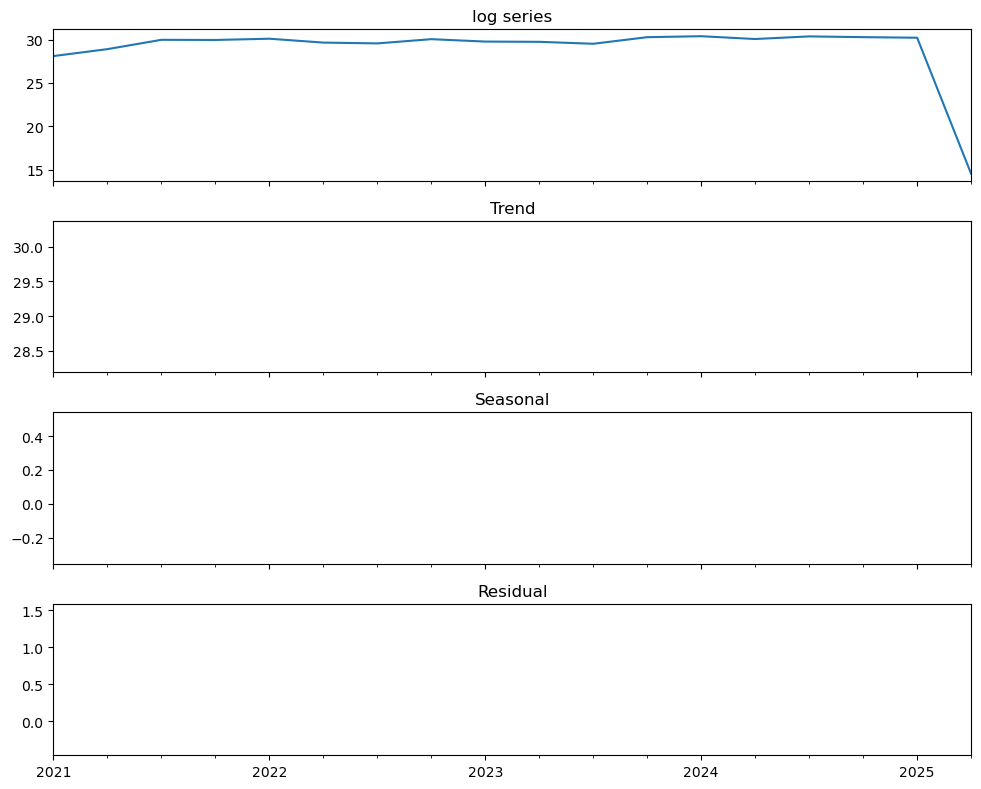

/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_6161/2267069415.py:41: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_p = kpss(diff_seasonal, nlags="auto")[1]
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


ADF on log: p = 0.8540
ADF on 1st-diff: p = 0.9856
ADF on seasonal diff: p = 1.0000
KPSS p = 0.1000 (want > 0.05)


/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

In [35]:
#fix the date thing and fit arima. a6a 6 PROSP3.NUM_ISSUER.Q.A6.Z.Z.Z.Z.Z.Z.A6.Z.Z.Z.Z.Z.Z.Z
df_key, modelk = check_and_flag(sub, m=4, do_log=True)

In [36]:
df_key

,key,date,value,forecast,lower_ci,upper_ci,residual,is_outlier,value_log
2021-01-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-01-01,1.594851e+12,0.000000,-2771.820521,2771.820521,28.097801,False,28.097801
2021-04-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-04-01,3.550793e+12,28.097801,-1931.884387,1988.079990,0.800391,False,28.898192
2021-07-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-07-01,1.041065e+13,28.898192,-1931.083996,1988.880380,1.075658,False,29.973850
2021-10-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-10-01,1.022223e+13,29.973850,-1930.008338,1989.956038,-0.018264,False,29.955586
2022-01-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-01-01,1.181308e+13,44.004617,-1341.931386,1429.940621,-13.904389,False,30.100229
2022-04-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-04-01,7.550089e+12,30.900619,22.453307,39.347931,-1.248039,False,29.652580
2022-07-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-07-01,6.882161e+12,30.728238,22.280926,39.175550,-1.168284,False,29.559954
2022-10-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-10-01,1.121288e+13,29.541690,21.094378,37.989002,0.506394,False,30.048084
2023-01-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2023-01-01,8.493220e+12,30.192727,21.745415,38.640039,-0.422438,False,29.770289
2023-04-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2023-04-01,8.245787e+12,29.322641,20.875329,37.769953,0.418082,False,29.740724


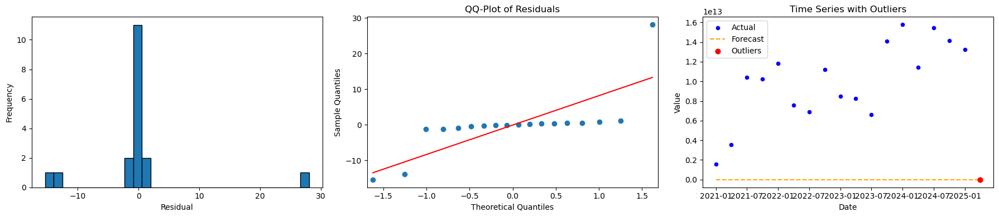

In [37]:
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot

df = df_key
residuals = df['residual']

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].hist(residuals, bins=30, edgecolor='black')

axes[0].set_xlabel("Residual")
axes[0].set_ylabel("Frequency")


qqplot(residuals, line='s', ax=axes[1])
axes[1].set_title("QQ-Plot of Residuals")

axes[2].scatter(df['date'], df['value'], color='blue', s=20, label='Actual')
axes[2].plot(df['date'], df['forecast'], linestyle='--', color='orange', label='Forecast')
axes[2].scatter(
    df[df['is_outlier']]['date'],
    df[df['is_outlier']]['value'],
    color='red', s=40, label='Outliers', zorder=5
)
axes[2].set_title("Time Series with Outliers")
axes[2].set_xlabel("Date")
axes[2].set_ylabel("Value")
axes[2].legend()

plt.tight_layout()
plt.show()

In [38]:
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima

def check_and_flag(df_group, m=4, do_log=True):
    df = df_group.sort_values('TIME_PERIOD').copy()
    df['date'] = pd.PeriodIndex(df['TIME_PERIOD'], freq='Q').to_timestamp()
    ts_raw = df.set_index('date')['OBS_VALUE'].astype(float)
    ts = np.log(ts_raw) if do_log and (ts_raw>0).all() else ts_raw

    # Decompose just to check seasonality
    res = seasonal_decompose(ts, model='additive', period=m)
    seasonal_strength = np.var(res.seasonal) / np.var(ts)
    use_seasonal = seasonal_strength > 0.01

    # F
    model = auto_arima(
    ts,
                   start_p=1, max_p=3,
                   start_q=1, max_q=3,
                   d=1,
                   seasonal=False,
                   stepwise=False,
                   suppress_warnings=True,
                   trace=True
)

    # In‐sample
    fitted_log, ci = model.predict_in_sample(return_conf_int=True, alpha=0.)
    lower_log, upper_log = ci[:,0], ci[:,1]

    # Back‐transform if needed
    if do_log and (ts_raw>0).all():
        forecast = np.exp(fitted_log)
        lower   = np.exp(lower_log)
        upper   = np.exp(upper_log)
    else:
        forecast, lower, upper = fitted_log, lower_log, upper_log

    residuals  = ts_raw - forecast
    is_outlier = (ts_raw < lower) | (ts_raw > upper)

    return pd.DataFrame({
        'key':       df_group['KEY'].iat[0],
        'date':      ts_raw.index,
        'value':     ts_raw.values,
        'forecast':  forecast,
        'lower_ci':  lower,
        'upper_ci':  upper,
        'residual':  residuals,
        'is_outlier': is_outlier
    }), model

In [39]:
df_key, modelk = check_and_flag(sub, m=4, do_log=True)

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=97.179, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=99.166, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=101.160, Time=0.02 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=99.165, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=101.165, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.06 sec


/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=101.165, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=103.149, Time=0.04 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=104.989, Time=0.04 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=106.984, Time=0.05 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=103.094, Time=0.02 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=105.083, Time=0.04 sec


/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.511 seconds


ValueError: Input contains infinity or a value too large for dtype('float64').

In [40]:
df_key

,key,date,value,forecast,lower_ci,upper_ci,residual,is_outlier,value_log
2021-01-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-01-01,1.594851e+12,0.000000,-2771.820521,2771.820521,28.097801,False,28.097801
2021-04-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-04-01,3.550793e+12,28.097801,-1931.884387,1988.079990,0.800391,False,28.898192
2021-07-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-07-01,1.041065e+13,28.898192,-1931.083996,1988.880380,1.075658,False,29.973850
2021-10-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2021-10-01,1.022223e+13,29.973850,-1930.008338,1989.956038,-0.018264,False,29.955586
2022-01-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-01-01,1.181308e+13,44.004617,-1341.931386,1429.940621,-13.904389,False,30.100229
2022-04-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-04-01,7.550089e+12,30.900619,22.453307,39.347931,-1.248039,False,29.652580
2022-07-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-07-01,6.882161e+12,30.728238,22.280926,39.175550,-1.168284,False,29.559954
2022-10-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2022-10-01,1.121288e+13,29.541690,21.094378,37.989002,0.506394,False,30.048084
2023-01-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2023-01-01,8.493220e+12,30.192727,21.745415,38.640039,-0.422438,False,29.770289
2023-04-01,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.D.Z.Z.Z.Z.Z.Z.Z.Z,2023-04-01,8.245787e+12,29.322641,20.875329,37.769953,0.418082,False,29.740724


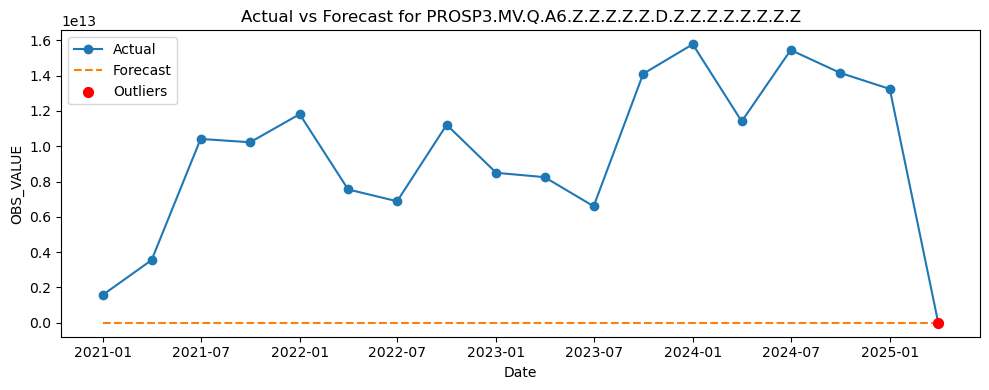

In [41]:
import matplotlib.pyplot as plt

# df_key is the output of check_and_flag(...)
# It has columns: date, value (original), forecast (original), is_outlier

plt.figure(figsize=(10,4))

# 1) Plot the real values
plt.plot(df_key['date'], df_key['value'], marker='o', linestyle='-', label='Actual')

# 2) Plot the real‐scale forecast
plt.plot(df_key['date'], df_key['forecast'], linestyle='--', label='Forecast')

# 3) Highlight outliers in red
out = df_key[df_key['is_outlier']]
plt.scatter(out['date'], out['value'], color='red', s=50, zorder=5, label='Outliers')

plt.title(f"Actual vs Forecast for {df_key['key'].iat[0]}")
plt.xlabel("Date")
plt.ylabel("OBS_VALUE")
plt.legend()
plt.tight_layout()
plt.show()

In [5]:
monthly = pd.read_csv('Prosp3_monthly_series.csv')

In [6]:
monthly = monthly[monthly['KEY']== 'PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z.Z.Z.Z']

NameError: name 'key' is not defined

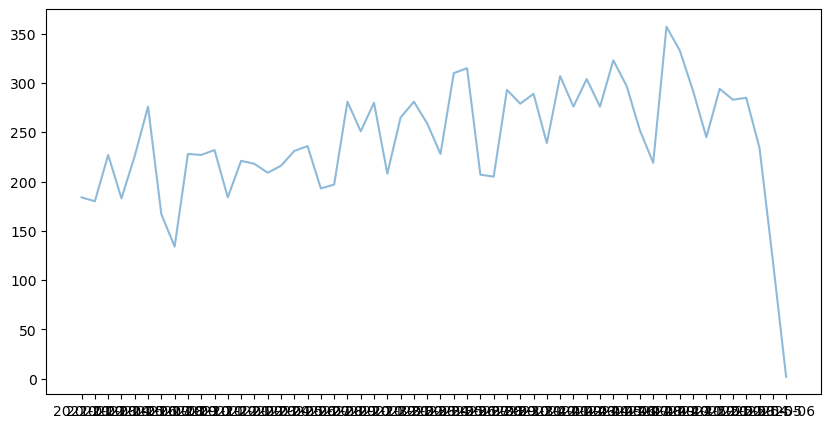

In [7]:
monthly= monthly.sort_values('TIME_PERIOD')
plt.figure(figsize=(10,5))
plt.plot(monthly['TIME_PERIOD'], monthly['OBS_VALUE'], label='Actual', alpha=0.5)
plt.title(f'Outlier detection for {key}')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
df_key, modelk = check_and_flag(monthly, m=12, do_log=True)

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=100.116, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=99.035, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=99.028, Time=0.01 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=100.721, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=97.578, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=99.577, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=101.574, Time=0.02 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=99.577, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=97.726, Time=0.03 sec


/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_

 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=94.541, Time=0.05 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=101.574, Time=0.01 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=98.785, Time=0.03 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.04 sec

Best model:  ARIMA(2,1,2)(0,0,0)[0] intercept
Total fit time: 0.404 seconds


ValueError: Input contains infinity or a value too large for dtype('float64').

In [ ]:
monthly

,DSD_VIEW,GROUP,TIME_PERIOD,CMPT_DATE,VALID_TO,RTN_DATE,MTIME,PK,KEY,OBS_VALUE,CNFDT_NUM,OBS_COM,UNIT_INDEX_BASE,OBS_STATUS,CNFDT_COU,CNFDT_OBS
89,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-01,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,1125291706017,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,184,NaN,NaN,Z,P,A6,PB_PB
125,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-02,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,893360852245,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,180,NaN,NaN,Z,P,A6,PB_PB
117,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-03,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,206166700143,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,227,NaN,NaN,Z,P,A6,PB_PB
91,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-04,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,635658429546,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,183,NaN,NaN,Z,P,A6,PB_PB
206,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-05,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,137444704964,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,226,NaN,NaN,Z,P,A6,PB_PB
71,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-06,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,335015314851,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,276,NaN,NaN,Z,P,A6,PB_PB
178,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-07,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,996440291277,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,167,NaN,NaN,Z,P,A6,PB_PB
108,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-08,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,188982517562,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,134,NaN,NaN,Z,P,A6,PB_PB
31,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-09,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,987847121766,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,228,NaN,NaN,Z,P,A6,PB_PB
130,PROSP3_SEC,PROSP3.NUM_ISSUER.M.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-10,2025-05-11,NaN,NaN,2025-05-11T19:37:38.486669Z,1228367402583,PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z....,227,NaN,NaN,Z,P,A6,PB_PB


In [ ]:
## change the reparsing of the dates.

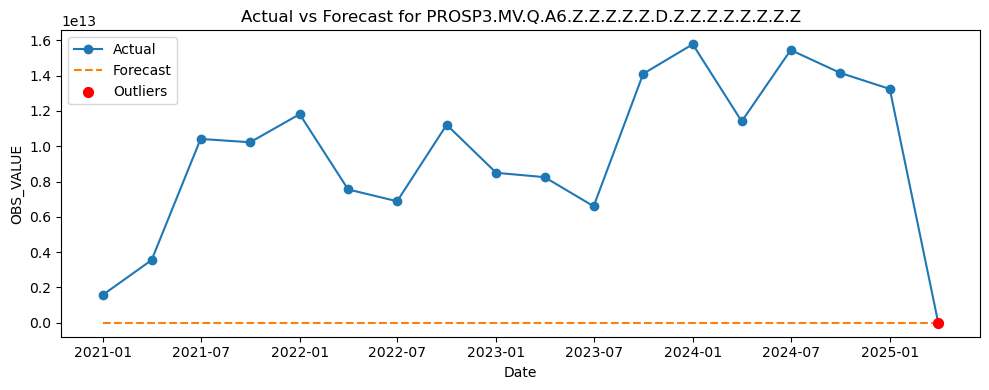

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))

# 1) Plot the real values
plt.plot(df_key['date'], df_key['value'], marker='o', linestyle='-', label='Actual')

# 2) Plot the real‐scale forecast
plt.plot(df_key['date'], df_key['forecast'], linestyle='--', label='Forecast')

# 3) Highlight outliers in red
out = df_key[df_key['is_outlier']]
plt.scatter(out['date'], out['value'], color='red', s=50, zorder=5, label='Outliers')

plt.title(f"Actual vs Forecast for {df_key['key'].iat[0]}")
plt.xlabel("Date")
plt.ylabel("OBS_VALUE")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import pmdarima as pm

def _infer_freq_and_m(index: pd.DatetimeIndex):
    """
    Infer the frequency string and seasonal period m from a datetime index.
    """
    freq = pd.infer_freq(index)
    if freq is None:
        # try difference-based detection
        diffs = np.diff(index.values.astype('datetime64[D]')).astype(int)
        if np.all(diffs == diffs[0]):
            if diffs[0] == 1:
                freq = 'D'
            elif diffs[0] >= 28 and diffs[0] <= 31:
                freq = 'M'
        else:
            raise ValueError(f"Could not infer a consistent freq from index: {index[:5]}")
    # map to seasonal period
    if freq.startswith('Q') or freq in ['Q']:
        m = 4
    elif freq.startswith('M'):
        m = 12
    elif freq.startswith('W'):
        m = 52
    elif freq.startswith('D'):
        m = 7
    else:
        raise ValueError(f"Unsupported frequency: {freq}")
    return freq, m


def fit_arima_and_flag_outliers(
        df: pd.DataFrame,
        key: str,
        key_col: str = 'key',
        date_col: str = 'period',
        value_col: str = 'value'):
    """
    Filter the DataFrame on the given key, infer time series frequency,
    fit an (S)ARIMA model, and flag outliers based on residuals.

    Parameters:
    - df: DataFrame containing at least key_col, date_col, and value_col.
    - key: the value in key_col to filter on.
    - key_col: column name for grouping key (default 'key').
    - date_col: column containing period strings (e.g. '2021-01') or dates.
    - value_col: numeric column to model.

    Returns:
    - model: fitted pmdarima model object.
    - results_df: DataFrame with columns ['value', 'pred', 'resid', 'outlier'] indexed by date.
    """
    # filter by key
    sub = df[df[key_col] == key].copy()
    if sub.empty:
        raise ValueError(f"No data found for key={key}")

    # parse dates and set index
    sub[date_col] = pd.to_datetime(sub[date_col])
    sub = sub.set_index(date_col).sort_index()

    # infer frequency and seasonal period
    freq, m = _infer_freq_and_m(sub.index)
    sub = sub.asfreq(freq)

    # fit auto ARIMA with seasonality
    model = pm.auto_arima(
        sub[value_col],
        seasonal=True,
        m=m,
        error_action='ignore',
        suppress_warnings=True
    )

    # in-sample predictions and residuals
    preds = pd.Series(model.predict_in_sample(), index=sub.index)
    resid = sub[value_col] - preds

    # flag outliers beyond 3 std dev
    sigma = resid.std()
    outliers = resid.abs() > 2.5 * sigma

    #### dynamic arima ---
    ## same outlier as param.




    results_df = pd.DataFrame({
        'value': sub[value_col],
        'pred': preds,
        'resid': resid,
        'outlier': outliers
    })

    return model, results_df


In [24]:
model, flagged = fit_arima_and_flag_outliers(monthly, key='PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z.Z.Z.Z',
                                           key_col='KEY', date_col='TIME_PERIOD', value_col='OBS_VALUE')
print(flagged[flagged['outlier']])

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/

             value        pred       resid  outlier
TIME_PERIOD                                        
2021-01-01     184    0.000000  184.000000     True
2021-02-01     180    2.193108  177.806892     True
2021-03-01     227    4.116752  222.883248     True
2021-04-01     183    6.396558  176.603442     True
2021-05-01     226    7.940559  218.059441     True
2021-06-01     276    9.827697  266.172303     True
2021-07-01     167   12.104452  154.895548     True
2021-09-01     228   13.278276  214.721724     True
2021-10-01     227   14.666625  212.333375     True
2021-11-01     232   15.912546  216.087454     True
2021-12-01     184   17.097723  166.902277     True
2025-05-01     120  284.306883 -164.306883     True


/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [25]:
flagged

,value,pred,resid,outlier
TIME_PERIOD,,,,
2021-01-01,184,0.000000,184.000000,True
2021-02-01,180,2.193108,177.806892,True
2021-03-01,227,4.116752,222.883248,True
2021-04-01,183,6.396558,176.603442,True
2021-05-01,226,7.940559,218.059441,True
2021-06-01,276,9.827697,266.172303,True
2021-07-01,167,12.104452,154.895548,True
2021-08-01,134,12.918861,121.081139,False
2021-09-01,228,13.278276,214.721724,True


In [11]:
def plot_results(results_df: pd.DataFrame):
    """
    Plot actual vs predicted values and highlight outliers.
    """
    plt.figure()
    plt.plot(results_df.index, results_df['value'], label='Actual')
    plt.plot(results_df.index, results_df['pred'], label='Predicted')
    out = results_df[results_df['outlier']]
    plt.scatter(out.index, out['value'], label='Outliers')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('ARIMA Fit and Outliers')
    plt.show()

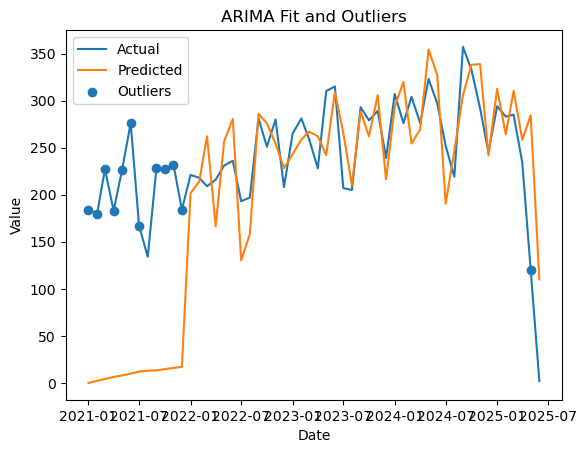

In [12]:
plot_results(flagged)

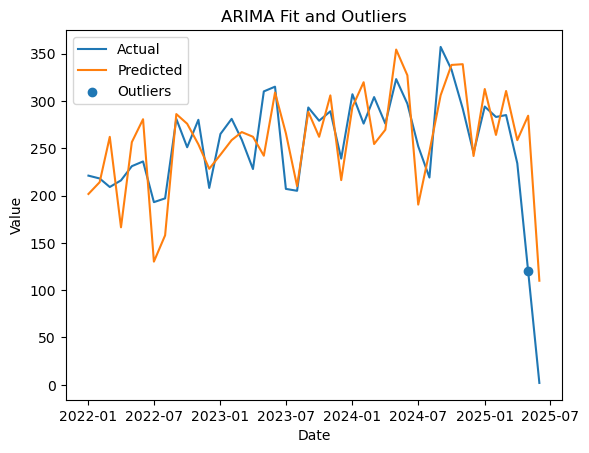

In [33]:
# assume m was inferred earlier
plot_results(flagged.iloc[12:])

flagged = flagged.iloc[12:]

In [18]:
flagged

,value,pred,resid,outlier
TIME_PERIOD,,,,
2022-01-01,221,201.631384,19.368616,False
2022-02-01,218,214.086794,3.913206,False
2022-03-01,209,262.008059,-53.008059,False
2022-04-01,216,166.417235,49.582765,False
2022-05-01,231,256.401735,-25.401735,False
2022-06-01,236,280.606323,-44.606323,False
2022-07-01,193,130.149412,62.850588,False
2022-08-01,197,157.952882,39.047118,False
2022-09-01,281,286.039676,-5.039676,False


In [57]:
from esmaplotly import esmaplotly
import plotly.graph_objects as go

def plot_arima_esma(
    results_df,
    date_col='TIME_PERIOD',
    obs_col='value',
    pred_col='pred',
    outlier_col='outlier',
    title =' '
):
    """
    ESMA‐style interactive chart:
      • solid blue line = actuals (excluding outliers)
      • dashed blue line = ARIMA forecast
      • orange dots = outliers
      plus light-grey horizontal grid lines
    """
    df = results_df.copy()
    if date_col not in df.columns:
        df.index.name = date_col
        df = df.reset_index()

    df[outlier_col] = df[outlier_col].astype(bool)
    normal = df[~df[outlier_col]]
    out    = df[df[outlier_col]]

    eplot = esmaplotly()
    fig = go.Figure()

    # 1) actuals line (ESMA blue)
    fig.add_trace(go.Scatter(
        x=normal[date_col],
        y=normal[obs_col],
        mode='lines',
        name='Actual',
        line=dict(color='#007EFF', width=2),
        legendgroup='act'
    ))

    # 2) forecast line (dashed ESMA blue)
    fig.add_trace(go.Scatter(
        x=df[date_col],
        y=df[pred_col],
        mode='lines',
        name='Forecast',
        line=dict(color='#7BD200', dash='dash', width=2),
        legendgroup='fc'
    ))

    # 3) outlier markers (ESMA orange)
    fig.add_trace(go.Scatter(
        x=out[date_col],
        y=out[obs_col],
        mode='markers',
        name='Outlier',
        marker=dict(color='#DB5700', size=8),
        legendgroup='pts'
    ))

    # apply ESMA layout & annotation
    fig = eplot.update_chart_trv(
        fig,
        annotation_text="Orange dots represent the flagged outliers; dashed line is the ARIMA forecast. <br> Note: The monthly ARIMA needs 12 periods to learn the dynamics of the timeseries."
    )
    fig.update_layout(title=title)

    # --- NEW: turn on horizontal grid lines on the y-axis ---
    fig.update_yaxes(
        showgrid=True,
        gridcolor='rgba(200,200,200,0.3)',  # light grey
        gridwidth=1
    )

    # export high-res if you like
    fig.write_image("chart_highres.png", width=1600, height=900, scale=2)
    fig.write_image("chart1.svg")

    fig.show()

# call exactly as before
plot_arima_esma(
    flagged,
    date_col='TIME_PERIOD',
    obs_col='value',
    pred_col='pred',
    outlier_col='outlier'
)

In [ ]:
!pip install -U kaleido

  Using cached kaleido-0.2.1-py2.py3-none-macosx_11_0_arm64.whl.metadata (15 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.8/85.8 MB 1.0 MB/s eta 0:00:0000:0100:030m


In [ ]:
import plotly.io as pio

# give yourself a big canvas and/or extra DPI
fig.write_image(
    "chart_highres.png",
    width=1600,        # width in pixels
    height=900,        # height in pixels
    scale=2            # 2× DPI
)

# or export vector:
fig.write_image("chart.svg")

AttributeError: 'Figure' object has no attribute 'write_image'

In [ ]:
flagged

,value,pred,resid,outlier
TIME_PERIOD,,,,
2022-01-01,221,201.631384,19.368616,False
2022-02-01,218,214.086794,3.913206,False
2022-03-01,209,262.008059,-53.008059,False
2022-04-01,216,166.417235,49.582765,False
2022-05-01,231,256.401735,-25.401735,False
2022-06-01,236,280.606323,-44.606323,False
2022-07-01,193,130.149412,62.850588,False
2022-08-01,197,157.952882,39.047118,False
2022-09-01,281,286.039676,-5.039676,False


25/05/21 13:01:21 WARN HeartbeatReceiver: Removing executor driver with no recent heartbeats: 29774046 ms exceeds timeout 120000 ms
25/05/21 13:01:21 WARN SparkContext: Killing executors is not supported by current scheduler.
25/05/21 13:01:21 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:124)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint

## Kjo

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/opt/anaconda3/

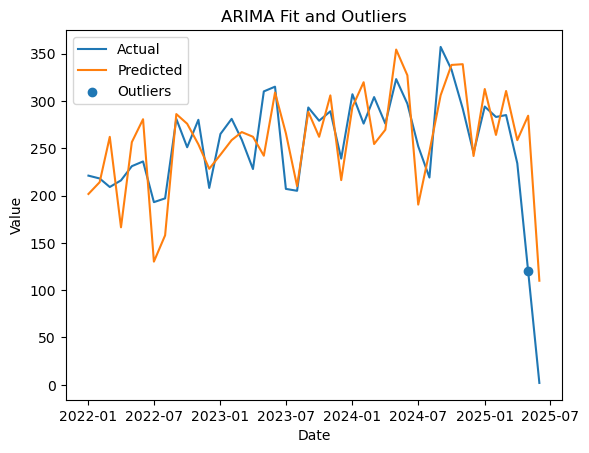

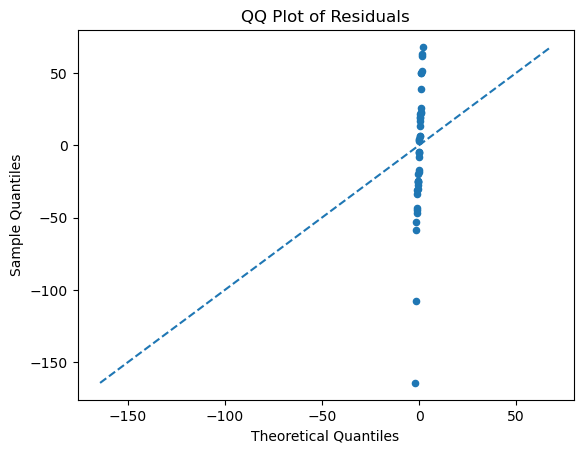

In [ ]:
import pandas as pd
import numpy as np
import pmdarima as pm
import matplotlib.pyplot as plt
import scipy.stats as stats


def _infer_freq_and_m(index: pd.DatetimeIndex):
    """
    Infer the frequency string and seasonal period m from a datetime index.
    """
    freq = pd.infer_freq(index)
    if freq is None:
        # fallback: check day differences
        diffs = np.diff(index.values.astype('datetime64[D]')).astype(int)
        if np.all(diffs == diffs[0]):
            freq = 'D' if diffs[0] == 1 else 'M' if 28 <= diffs[0] <= 31 else None
        if freq is None:
            raise ValueError(f"Could not infer a consistent freq from index: {index[:5]}")
    # map to seasonal period
    if freq.startswith('Q'):
        m = 4
    elif freq.startswith('M'):
        m = 12
    elif freq.startswith('W'):
        m = 52
    elif freq.startswith('D'):
        m = 7
    else:
        raise ValueError(f"Unsupported frequency: {freq}")
    return freq, m


def fit_arima_and_flag_outliers(
        df: pd.DataFrame,
        key: str,
        key_col: str = 'key',
        date_col: str = 'period',
        value_col: str = 'value'):
    """
    Filter df by key, fit a seasonal ARIMA, and flag outliers beyond 3σ.

    Returns:
      model      - the fitted pmdarima model
      results_df - DataFrame with ['value','pred','resid','outlier'] indexed by date
    """
    sub = df[df[key_col] == key].copy()
    if sub.empty:
        raise ValueError(f"No data found for key={key}")

    # parse and set index
    sub[date_col] = pd.to_datetime(sub[date_col])
    sub = sub.set_index(date_col).sort_index()

    # infer freq & seasonal period, restrict to actual data span
    freq, m = _infer_freq_and_m(sub.index)
    sub = sub.asfreq(freq)

    # fit seasonal ARIMA (auto selects d and D for stationarity)
    model = pm.auto_arima(
        sub[value_col],
        seasonal=True,
        m=m,
        error_action='ignore',
        suppress_warnings=True
    )

    # in-sample predictions (skip warm-up)
    preds = pd.Series(
        model.predict_in_sample(start=m),
        index=sub.index[m:]
    )
    actual = sub[value_col].iloc[m:]
    resid = actual - preds

    # flag points >3σ
    sigma = resid.std()
    outliers = resid.abs() > 3 * sigma

    results_df = pd.DataFrame({
        'value': actual,
        'pred': preds,
        'resid': resid,
        'outlier': outliers
    })
    return model, results_df


def plot_results(results_df: pd.DataFrame):
    """
    Plot actual vs predicted and highlight outliers.
    """
    plt.figure()
    plt.plot(results_df.index, results_df['value'], label='Actual')
    plt.plot(results_df.index, results_df['pred'], label='Predicted')
    out = results_df[results_df['outlier']]
    plt.scatter(out.index, out['value'], label='Outliers')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('ARIMA Fit and Outliers')
    plt.show()


def plot_qq(results_df: pd.DataFrame):
    """
    Display a QQ-plot of the residuals against a normal distribution.
    """
    resid = results_df['resid'].dropna()
    osm, osr = stats.probplot(resid, dist='norm', fit=False)

    plt.figure()
    plt.scatter(osm, osr, s=20)
    mn = min(osm.min(), osr.min())
    mx = max(osm.max(), osr.max())
    plt.plot([mn, mx], [mn, mx], linestyle='--')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title('QQ Plot of Residuals')
    plt.show()

# Example usage:
model, flagged = fit_arima_and_flag_outliers(monthly, key='PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z.Z.Z.Z',
                                           key_col='KEY', date_col='TIME_PERIOD', value_col='OBS_VALUE')
plot_results(flagged)
plot_qq(flagged)


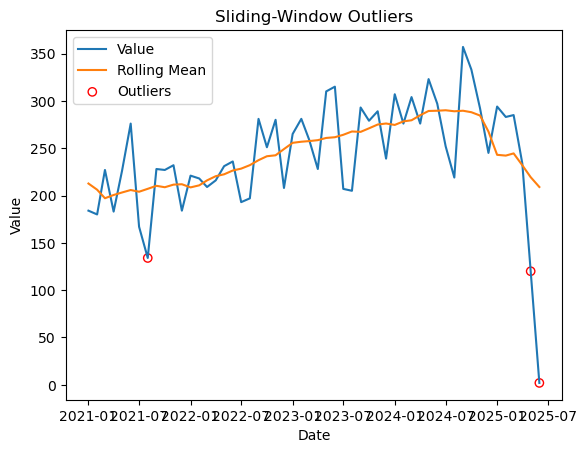

In [37]:
import pandas as pd
import numpy as np
import pmdarima as pm
import matplotlib.pyplot as plt
import scipy.stats as stats


def _infer_freq_and_m(index: pd.DatetimeIndex):
    """
    Infer pandas frequency string and seasonal period m from a datetime index.
    """
    freq = pd.infer_freq(index)
    if freq is None:
        diffs = np.diff(index.values.astype('datetime64[D]')).astype(int)
        if np.all(diffs == diffs[0]):
            freq = 'D' if diffs[0] == 1 else 'M' if 28 <= diffs[0] <= 31 else None
        if freq is None:
            raise ValueError(f"Could not infer freq from index: {index[:5]}")
    if freq.startswith('Q'):
        m = 4
    elif freq.startswith('M'):
        m = 12
    elif freq.startswith('W'):
        m = 52
    elif freq.startswith('D'):
        m = 7
    else:
        raise ValueError(f"Unsupported frequency: {freq}")
    return freq, m


def fit_arima_and_flag_outliers(
        df: pd.DataFrame,
        key: str,
        key_col: str = 'KEY',
        date_col: str = 'TIME_PERIOD',
        value_col: str = 'OBS_VALUE',
        threshold: float = 3.0,
        robust: bool = False):
    """
    Seasonal ARIMA with robust or sigma-based outlier flagging.
    Returns model and full-index DataFrame with value, pred, resid, outlier.
    """
    sub = df[df[key_col] == key].copy()
    if sub.empty:
        raise ValueError(f"No data for key={key}")
    sub[date_col] = pd.to_datetime(sub[date_col])
    sub = sub.set_index(date_col).sort_index()
    freq, m = _infer_freq_and_m(sub.index)
    sub = sub.asfreq(freq)

    model = pm.auto_arima(
        sub[value_col], seasonal=True, m=m,
        error_action='ignore', suppress_warnings=True
    )
    preds = model.predict_in_sample(start=m)
    dates = sub.index

    # Prepare full-length series
    pred_full = pd.Series(index=dates, dtype=float)
    resid_full = pd.Series(index=dates, dtype=float)
    pred_full.iloc[m:] = preds
    actual = sub[value_col]
    resid_calc = actual.iloc[m:] - preds
    resid_full.iloc[m:] = resid_calc

    # choose scale
    if robust:
        # median absolute deviation
        med = resid_calc.median()
        scale = (resid_calc - med).abs().median()
        out = (resid_calc - med).abs() > threshold * scale
    else:
        sigma = resid_calc.std()
        out = resid_calc.abs() > threshold * sigma
    out_full = pd.Series(False, index=dates)
    out_full.iloc[m:] = out

    results_df = pd.DataFrame({
        'value': actual,
        'pred': pred_full,
        'resid': resid_full,
        'outlier': out_full
    })
    return model, results_df


def flag_outliers_sliding_window(
        df: pd.DataFrame,
        key: str,
        key_col: str = 'KEY',
        date_col: str = 'TIME_PERIOD',
        value_col: str = 'OBS_VALUE',
        window: int = 12,
        threshold: float = 4.0,
        robust: bool = False):
    """
    Rolling-window outlier detection.
    If robust=False uses rolling std, else rolling MAD.
    Returns DataFrame with value, rolling_mean, rolling_scale, resid, outlier.
    """
    sub = df[df[key_col] == key].copy()
    if sub.empty:
        raise ValueError(f"No data for key={key}")
    sub[date_col] = pd.to_datetime(sub[date_col])
    sub = sub.set_index(date_col).sort_index()
    series = sub[value_col].astype(float).asfreq(pd.infer_freq(sub.index))

    # rolling mean
    roll_mean = series.rolling(window=window, min_periods=1, center=True).mean()
    if robust:
        # rolling MAD
        roll_scale = series.rolling(window=window, min_periods=1, center=True)
        roll_scale = roll_scale.apply(lambda x: np.median(np.abs(x - np.median(x))), raw=False)
    else:
        roll_scale = series.rolling(window=window, min_periods=1, center=True).std()

    resid = series - roll_mean
    outliers = resid.abs() > threshold * roll_scale

    results_df = pd.DataFrame({
        'value': series,
        'rolling_mean': roll_mean,
        'rolling_scale': roll_scale,
        'resid': resid,
        'outlier': outliers
    })
    return results_df


def plot_sliding_window(results_df: pd.DataFrame):
    """
    Plot sliding-window stats: value, rolling_mean, and flagged outliers.
    """
    plt.figure()
    plt.plot(results_df.index, results_df['value'], label='Value')
    plt.plot(results_df.index, results_df['rolling_mean'], label='Rolling Mean')
    out = results_df[results_df['outlier']]
    plt.scatter(out.index, out['value'], facecolors='none', edgecolors='red', label='Outliers')
    plt.legend()
    plt.xlabel('Date'); plt.ylabel('Value'); plt.title('Sliding-Window Outliers')
    plt.show()

# Examples:

flag_df = flag_outliers_sliding_window(monthly, key='PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z.Z.Z.Z', window=12, threshold=3, robust=True)
plot_sliding_window(flag_df)


In [39]:
flag_df

,value,rolling_mean,rolling_scale,resid,outlier
TIME_PERIOD,,,,,
2021-01-01,184.0,212.666667,22.0,-28.666667,False
2021-02-01,180.0,206.142857,17.0,-26.142857,False
2021-03-01,227.0,197.125000,29.5,29.875000,False
2021-04-01,183.0,200.555556,42.0,-17.555556,False
2021-05-01,226.0,203.200000,22.5,22.800000,False
2021-06-01,276.0,205.818182,42.0,70.181818,False
2021-07-01,167.0,204.000000,22.5,-37.000000,False
2021-08-01,134.0,207.083333,24.0,-73.083333,True
2021-09-01,228.0,210.250000,7.0,17.750000,False


In [ ]:
from esmaplotly import esmaplotly
import plotly.graph_objects as go
import pandas as pd

def plot_sliding_window_esma_plotly(
        flagged: pd.DataFrame,
        date_col: str = 'TIME_PERIOD',
        value_col: str = 'value',
        rolling_mean_col: str = 'rolling_mean',
        outlier_col: str = 'outlier'):
    # 1) Bring index into a column
    df = flagged.reset_index()
    df[date_col] = pd.to_datetime(df[date_col])

    # 2) Single x-axis, y-series, mask
    x = df[date_col]
    y = df[value_col]
    rm = df[rolling_mean_col]
    mask = df[outlier_col].astype(bool)

    eplot = esmaplotly()
    fig = go.Figure()

    # A) Plot ALL actuals (blue solid) – include outliers in the line
    fig.add_trace(go.Scatter(
        x=x,
        y=y,
        mode='lines',
        name='Value',
        line=dict(color='#007EFF', width=4),
        legendgroup='val'
    ))

    # B) Rolling mean (green dashed)
    fig.add_trace(go.Scatter(
        x=x,
        y=rm,
        mode='lines',
        name='Rolling Mean',
        line=dict(color='#7BD200', dash='dash', width=4),
        legendgroup='mean'
    ))

    # C) Outlier markers (orange open circles)
    fig.add_trace(go.Scatter(
        x=x[mask],
        y=y[mask],
        mode='markers',
        name='Outliers',
        marker=dict(color='#DB5700', size=14, symbol='circle'),
        legendgroup='out'
    ))

    # Horizontal gridlines on y-axis
    fig.update_yaxes(
        showgrid=True,
        gridcolor='rgba(200,200,200,0.3)',
        gridwidth=1
    )
    fig.update_xaxes(showgrid=False)

    # Transparent background & layout
    fig.update_layout(
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)',
        font=dict(size=14),
        legend=dict(font=dict(size=14)),
        margin=dict(l=60, r=40, t=60),  # extra bottom for annotation
        width=1000, height=600
    )

    # ESMA footer annotation — manually added so it exports
    fig.add_annotation(
        xref="paper", yref="paper",
        x=0, y=-0.15,
        showarrow=False,
        text="Note: rolling-window outliers flagged at ±4σ around the dashed trend.",
        font=dict(size=16),
        align="left"
    )

    # Save & show
    fig.write_image('sliding_window_esma.png', width=1000, height=600, scale=2)
    fig.show()
    return fig

# Call it without any other changes:
plot_sliding_window_esma_plotly(
    flag_df,
    date_col='TIME_PERIOD',
    value_col='value',
    rolling_mean_col='rolling_mean',
    outlier_col='outlier'
)

25/05/22 02:17:34 WARN HeartbeatReceiver: Removing executor driver with no recent heartbeats: 904135 ms exceeds timeout 120000 ms
25/05/22 02:17:34 WARN SparkContext: Killing executors is not supported by current scheduler.
25/05/22 02:17:40 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at o

In [58]:
flag_df

,value,rolling_mean,rolling_scale,resid,outlier
TIME_PERIOD,,,,,
2021-01-01,184.0,212.666667,22.0,-28.666667,False
2021-02-01,180.0,206.142857,17.0,-26.142857,False
2021-03-01,227.0,197.125000,29.5,29.875000,False
2021-04-01,183.0,200.555556,42.0,-17.555556,False
2021-05-01,226.0,203.200000,22.5,22.800000,False
2021-06-01,276.0,205.818182,42.0,70.181818,False
2021-07-01,167.0,204.000000,22.5,-37.000000,False
2021-08-01,134.0,207.083333,24.0,-73.083333,True
2021-09-01,228.0,210.250000,7.0,17.750000,False


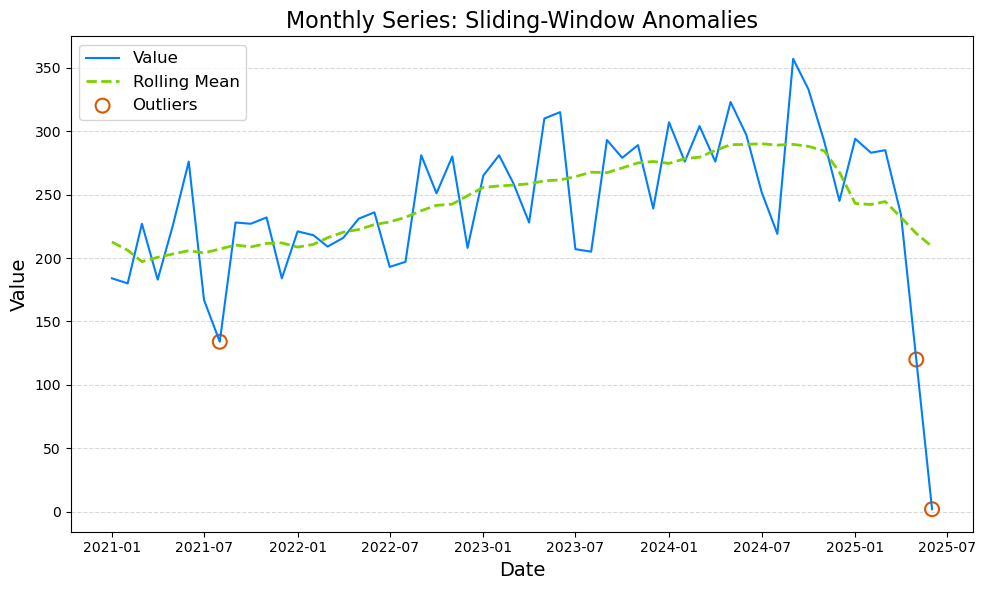

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def plot_sliding_window_custom(
        flagged: pd.DataFrame,
        date_col: str = 'TIME_PERIOD',
        value_col: str = 'value',
        rolling_mean_col: str = 'rolling_mean',
        outlier_col: str = 'outlier',
        title: str = 'Sliding-Window Outliers'):
    """
    • solid blue   = actuals
    • dashed green = rolling mean
    • orange dots  = outliers
    • light-grey horizontal grid
    • fully transparent background
    """
    # bring index into a column
    df = flagged.reset_index().rename(columns={'index': date_col})
    df[date_col] = pd.to_datetime(df[date_col])
    x = df[date_col]
    y = df[value_col]
    rm = df[rolling_mean_col]
    out_df = df[df[outlier_col]]

    # transparent figure & axes
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='none')
    ax.set_facecolor('none')

    # 1) actuals: solid ESMA blue
    ax.plot(x, y,
            color='#007EFF',
            linewidth=1.5,
            label='Value')

    # 2) rolling mean: dashed ESMA green
    ax.plot(x, rm,
            color='#7BD200',
            linestyle='--',
            linewidth=2,
            label='Rolling Mean')

    # 3) outliers: open ESMA orange circles
    ax.scatter(out_df[date_col], out_df[value_col],
               facecolors='none',
               edgecolors='#DB5700',
               s=100,
               linewidth=1.5,
               label='Outliers')

    # horizontal gridlines only
    ax.grid(axis='y', color='gray', linestyle='--', alpha=0.3)

    # labels, legend, title
    ax.set_title(title, fontsize=16, color='black')
    ax.set_xlabel('Date', fontsize=14, color='black')
    ax.set_ylabel('Value', fontsize=14, color='black')
    leg = ax.legend(fontsize=12, loc='upper left')
    for text in leg.get_texts():
        text.set_color('black')

    plt.tight_layout()
    plt.show()


# Example call:
plot_sliding_window_custom(
    flag_df,
    date_col='TIME_PERIOD',
    value_col='value',
    rolling_mean_col='rolling_mean',
    outlier_col='outlier',
    title='Monthly Series: Sliding-Window Anomalies'
)

In [ ]:
import pandas as pd
import numpy as np
import pmdarima as pm
import matplotlib.pyplot as plt
import scipy.stats as stats


def _infer_freq_and_m(index: pd.DatetimeIndex):
    """
    Infer frequency string and seasonal period m from a datetime index.
    """
    freq = pd.infer_freq(index)
    if freq is None:
        diffs = np.diff(index.values.astype('datetime64[D]')).astype(int)
        if np.all(diffs == diffs[0]):
            freq = 'D' if diffs[0] == 1 else 'M' if 28 <= diffs[0] <= 31 else None
        if freq is None:
            raise ValueError(f"Could not infer a consistent freq from index: {index[:5]}")
    if freq.startswith('Q'):
        m = 4
    elif freq.startswith('M'):
        m = 12
    elif freq.startswith('W'):
        m = 52
    elif freq.startswith('D'):
        m = 7
    else:
        raise ValueError(f"Unsupported frequency: {freq}")
    return freq, m


def fit_arima_and_flag_outliers(
        df: pd.DataFrame,
        key: str,
        key_col: str = 'key',
        date_col: str = 'period',
        value_col: str = 'value',
        threshold: float = 3.0,
        robust: bool = False):
    """
    Fit seasonal ARIMA on a filtered series and flag outliers.

    Parameters:
      df        - DataFrame with key, date, and value columns
      key       - value in key_col to filter on
      threshold - multiple of sigma or MAD for outlier cutoff
      robust    - if True, use median/MAD; else use mean/std

    Returns:
      model       - the fitted pmdarima model
      results_df  - DataFrame indexed by date with columns:
                    ['value','pred','resid','outlier']
                    (pred and resid are NaN for the first m points)
    """
    # filter and prepare index
    sub = df[df[key_col] == key].copy()
    if sub.empty:
        raise ValueError(f"No data found for key={key}")
    sub[date_col] = pd.to_datetime(sub[date_col])
    sub = sub.set_index(date_col).sort_index()

    # infer frequency and seasonal period, then align
    freq, m = _infer_freq_and_m(sub.index)
    sub = sub.asfreq(freq)

    # fit ARIMA with automatic differencing
    model = pm.auto_arima(
        sub[value_col],
        seasonal=True,
        m=m,
        error_action='ignore',
        suppress_warnings=True
    )

    # in-sample predictions skipping warm-up
    preds = model.predict_in_sample(start=m)
    dates = sub.index

    # build full-length prediction & residual series
    pred_full = pd.Series(index=dates, dtype=float)
    resid_full = pd.Series(index=dates, dtype=float)
    pred_full.iloc[m:] = preds
    resid_calc = sub[value_col].iloc[m:] - preds
    resid_full.iloc[m:] = resid_calc

    # compute outliers
    if robust:
        med = resid_calc.median()
        mad = (resid_calc - med).abs().median()
        out = (resid_calc - med).abs() > threshold * mad
    else:
        sigma = resid_calc.std()
        out = resid_calc.abs() > threshold * sigma
    out_full = pd.Series(False, index=dates)
    out_full.iloc[m:] = out

    # assemble results
    results_df = pd.DataFrame({
        'value': sub[value_col],
        'pred': pred_full,
        'resid': resid_full,
        'outlier': out_full
    })
    return model, results_df


def plot_results(results_df: pd.DataFrame):
    """
    Plot actual vs predicted and highlight outliers.
    All dates (including warm-up) are shown; NaNs are skipped.
    """
    plt.figure()
    plt.plot(results_df.index, results_df['value'], marker='o', label='Actual')
    plt.plot(results_df.index, results_df['pred'], marker='x', label='Predicted')
    out = results_df[results_df['outlier']]
    plt.scatter(out.index, out['value'], s=80, facecolors='none', edgecolors='red', label='Outliers')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('ARIMA Fit and Outliers')
    plt.show()


def plot_qq(results_df: pd.DataFrame):
    """
    Display a QQ-plot of in-sample residuals vs a normal distribution.
    """
    resid = results_df['resid'].dropna()
    osm, osr = stats.probplot(resid, dist='norm', fit=False)

    plt.figure()
    plt.scatter(osm, osr, s=20)
    mn, mx = min(osm.min(), osr.min()), max(osm.max(), osr.max())
    plt.plot([mn, mx], [mn, mx], linestyle='--')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title('QQ Plot of Residuals')
    plt.show()

# Usage example:
# model, flagged = fit_arima_and_flag_outliers(df, key='YOUR_KEY', threshold=2.5, robust=True)
# plot_results(flagged)
# plot_qq(flagged)


In [ ]:
def fit_autoencoder_and_flag_outliers(
        df: pd.DataFrame,
        key: str,
        key_col: str = 'KEY',
        date_col: str = 'TIME_PERIOD',
        value_col: str = 'OBS_VALUE',
        window_size: int = 5,
        latent_dim: int = 2,
        epochs: int = 50,
        batch_size: int = 16,
        threshold: float = 2.0,
        threshold_method: str = 'std'):
    """
    Train a simple autoencoder on sliding windows and flag outliers by reconstruction error.

    Parameters:
      df               - DataFrame with key/date/value columns
      key              - filter value in key_col
      window_size      - number of time steps per window
      latent_dim       - dimensionality of encoded representation
      epochs           - training epochs
      batch_size       - training batch size
      threshold        - multiplier (for 'std') or quantile (for 'quantile')
      threshold_method - 'std' uses mean+threshold*std; 'quantile' uses (1-threshold) quantile

    Returns:
      model      - trained keras autoencoder
      results_df - DataFrame indexed by date (window end) with columns:
                   ['value', 'recon_error', 'outlier']
    """
    from sklearn.preprocessing import MinMaxScaler
    from tensorflow.keras.models import Model
    from tensorflow.keras.layers import Input, Dense
    from tensorflow.keras.optimizers import Adam

    # filter and prepare
    sub = df[df[key_col] == key].copy()
    if sub.empty:
        raise ValueError(f"No data for key={key}")
    sub[date_col] = pd.to_datetime(sub[date_col])
    sub = sub.set_index(date_col).sort_index()
    series = sub[value_col].astype(float).asfreq(pd.infer_freq(sub.index))
    values = series.values.reshape(-1, 1)

    # scale to [0,1]
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(values)

    # build sliding windows
    X = []
    for i in range(len(scaled) - window_size + 1):
        X.append(scaled[i:i + window_size].flatten())
    X = np.array(X)

    # train/test split: use all for training
    X_train = X

    # autoencoder architecture
    input_dim = window_size
    input_layer = Input(shape=(input_dim,))
    encoded = Dense(latent_dim, activation='relu')(input_layer)
    decoded = Dense(input_dim, activation='sigmoid')(encoded)
    autoenc = Model(inputs=input_layer, outputs=decoded)
    autoenc.compile(optimizer=Adam(), loss='mse')

    # train
    autoenc.fit(X_train, X_train,
                epochs=epochs,
                batch_size=batch_size,
                shuffle=True,
                verbose=0)

    # reconstruction
    X_pred = autoenc.predict(X)
    # compute mse per window
    mse = np.mean(np.power(X - X_pred, 2), axis=1)

    # determine threshold
    if threshold_method == 'std':
        mean_mse = mse.mean()
        std_mse = mse.std()
        err_thresh = mean_mse + threshold * std_mse
    elif threshold_method == 'quantile':
        err_thresh = np.quantile(mse, 1 - threshold)
    else:
        raise ValueError("threshold_method must be 'std' or 'quantile'")

    # map errors & outliers to dates (window end)
    dates = series.index[window_size - 1:]
    recon_error = pd.Series(mse, index=dates)
    outliers = recon_error > err_thresh

    results_df = pd.DataFrame({
        'value': series[window_size - 1:],
        'recon_error': recon_error,
        'outlier': outliers
    })
    return autoenc, results_df


def plot_autoencoder_outliers(results_df: pd.DataFrame):
    """
    Plot time series with autoencoder outliers highlighted.
    """
    plt.figure()
    plt.plot(results_df.index, results_df['value'], label='Value')
    out = results_df[results_df['outlier']]
    plt.scatter(out.index, out['value'], s=80,
                facecolors='none', edgecolors='red', label='Outliers')
    plt.legend()
    plt.xlabel('Date'); plt.ylabel('Value'); plt.title('Autoencoder Anomaly Detection')
    plt.show()

In [ ]:
au, e = fit_autoencoder_and_flag_outliers(monthly, key='PROSP3.NUM_ISSUER.M.A6.Z.Z.Z.Z.Z.D.A6.Z.Z.Z.Z.Z.Z.Z')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


In [ ]:
e

,value,recon_error,outlier
TIME_PERIOD,,,
2021-05-01,226.0,0.004223,False
2021-06-01,276.0,0.016367,False
2021-07-01,167.0,0.011754,False
2021-08-01,134.0,0.012898,False
2021-09-01,228.0,0.026234,False
2021-10-01,227.0,0.044898,False
2021-11-01,232.0,0.013135,False
2021-12-01,184.0,0.006679,False
2022-01-01,221.0,0.006493,False


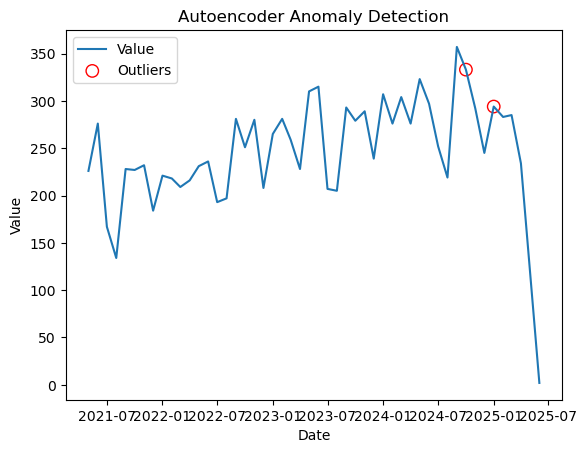

In [ ]:
plot_autoencoder_outliers(e)

In [ ]:
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.7/252.7 MB 1.7 MB/s eta 0:00:0000:0100:05
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 1.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 1.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 1.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 1.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.4/670.4 kB 1.8 MB/s eta 0:00:00-:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 2.3 MB/s eta 0:00:00a 0:00:01
